In [1]:
### make all necessary imports

# common libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
import plotly.express as px
import cmasher as cmr
from scipy.ndimage import gaussian_filter
import matplotlib.patheffects as path_effects


# mpl soccer imports
from mplsoccer import Pitch, VerticalPitch, Sbopen, FontManager
from mplsoccer.dimensions import center_scale_dims
from mplsoccer.utils import FontManager


# createpitch import
from matplotlib.patches import Arc

# import functions from football_fx inside the src folder
import sys
import os
# Get the absolute path of the parent directory
sys.path.append(os.path.abspath("../src"))
# functions in src folder
from football_fx import clock_obj_int, fit_coords, sorting_playtype, sorting_plays

# favorite team colors to utilize 
# ateneo blue, dark tan, KU crimson, rosso corsa 
arsenal_colors = ['#023474','#9C824A','#EF0107','#DB0007']
# blue, burgundy, red, gold, yellow
barca_colors = ['#004D98','#A50044','#DB0030','#EDBB00', '#FFED02']


## Analyze the data

In [2]:
# Import and look at the data
inp = input('Select the league (3 digits), such epl:')
df = pd.read_csv(f'../data/sorted/{inp}_player_stats_match.csv', parse_dates=['game_date'])
df.head(3)

,match_id,game_date,team_name,team_abb,team_id,home_team_id,away_team_id,home_team_won,home_team_score,away_team_score,...,player,play_id,key_play_id,playtype_id,events,goal_scored,fieldpositionX,fieldPositionY,fieldPosition2X,fieldPosition2Y
0,704660,2024-08-15 17:00:00,Athletic Club,ATH,93,93,2922,False,1,1,...,Carles Pérez,43550762,NaN,66,Álex Berenguer Foul,NaN,0.814,0.192,0.000,0.00
1,704660,2024-08-15 17:00:00,Getafe,GET,2922,93,2922,False,1,1,...,Djené,43550766,NaN,68,Djené Offside,NaN,0.886,0.086,0.712,0.74
2,704660,2024-08-15 17:00:00,Athletic Club,ATH,93,93,2922,False,1,1,...,Gorka Guruzeta,43550771,NaN,66,Gorka Guruzeta Foul,NaN,0.624,0.344,0.000,0.00


In [3]:
# Are there many null values?
df.isnull().sum()

match_id               0
game_date              0
team_name              0
team_abb               0
team_id                0
home_team_id           0
away_team_id           0
home_team_won          0
home_team_score        0
away_team_score        0
attendance             0
period                 0
play_order             0
clock                  1
seconds                0
player                 3
play_id                0
key_play_id        12161
playtype_id            0
events                 0
goal_scored        12161
fieldpositionX         0
fieldPositionY         0
fieldPosition2X        0
fieldPosition2Y        0
dtype: int64

Many null values in:
* key_play_id does not account for every single type of play
* goal_scored show a 0 for every play that does not end up in a goal and a NaN value for every play that is not in key_play_id
* 1 missing clock value and 2 missing player values. It would be best to drop them.

In [4]:
# Descriptive statistics focused on mean, median, and std because there are way too many things to look at right now
desc_stats = df.describe()
# desc_stats
desc_stats.loc[["mean","50%", "std"],:]

,match_id,game_date,team_id,home_team_id,away_team_id,home_team_score,away_team_score,attendance,period,play_order,seconds,play_id,key_play_id,playtype_id,goal_scored,fieldpositionX,fieldPositionY,fieldPosition2X,fieldPosition2Y
mean,704779.784005,2024-11-12 17:30:53.163251200,1572.402008,1612.479645,1663.312749,1.476826,1.151630,29942.373951,1.578669,37.742539,3070.335580,4.415034e+07,4.415821e+07,89.765025,0.225955,0.389555,0.428409,0.053924,0.185645
50%,704779.000000,2024-11-09 13:00:00,97.000000,97.000000,97.000000,1.000000,1.000000,22651.000000,2.000000,37.000000,3132.000000,4.417621e+07,4.419322e+07,76.000000,0.000000,0.330000,0.454000,0.000000,0.000000
std,69.609990,NaN,4103.536334,4191.554440,4265.436316,1.218614,1.097874,17495.227713,0.493789,22.649602,1594.487081,3.619168e+05,3.609586e+05,26.097048,0.418298,0.300576,0.284301,0.145795,0.255926


After looking at the data, we are deciding to just focus on mean, median, and std.

Assumption: Most values are similar between median and mean. Std is quite high for seconds and play ids, so we should not expect the data to be uniform  in those features. 

In [5]:
# Looking at the different data types
df.dtypes

match_id                    int64
game_date          datetime64[ns]
team_name                  object
team_abb                   object
team_id                     int64
home_team_id                int64
away_team_id                int64
home_team_won                bool
home_team_score             int64
away_team_score             int64
attendance                  int64
period                      int64
play_order                  int64
clock                      object
seconds                     int64
player                     object
play_id                     int64
key_play_id               float64
playtype_id                 int64
events                     object
goal_scored               float64
fieldpositionX            float64
fieldPositionY            float64
fieldPosition2X           float64
fieldPosition2Y           float64
dtype: object

game_date will be broken out into year, month, day, and hour

It might be best to transform clock into an integer or create a new column. 

play_id, playtype_id, key_play_id, and events may need to be sorted out better to alow for dissection. Probably best to sort out the type of plays based on goal_scored since that is the information we are interested in right now

In [6]:
# create columns for year, month, day, hour
df['day'] = df['game_date'].dt.day
df['month'] = df['game_date'].dt.month
df['year'] = df['game_date'].dt.year
df['hour'] = df['game_date'].dt.hour

In [7]:
# drop null value(s) from the clock feature and the player feature
df.dropna(subset=['clock'], inplace=True)

df.dropna(subset=['player'], inplace=True)

df.isnull().sum()

match_id               0
game_date              0
team_name              0
team_abb               0
team_id                0
home_team_id           0
away_team_id           0
home_team_won          0
home_team_score        0
away_team_score        0
attendance             0
period                 0
play_order             0
clock                  0
seconds                0
player                 0
play_id                0
key_play_id        12157
playtype_id            0
events                 0
goal_scored        12157
fieldpositionX         0
fieldPositionY         0
fieldPosition2X        0
fieldPosition2Y        0
day                    0
month                  0
year                   0
hour                   0
dtype: int64

only null values left are in key_play_id and goal_scored which was expected. And we still have 12617 rows

In [8]:
# change all null values in goal_scored to 0
df['goal_scored'] = df['goal_scored'].fillna(0)
df.isnull().sum()

match_id               0
game_date              0
team_name              0
team_abb               0
team_id                0
home_team_id           0
away_team_id           0
home_team_won          0
home_team_score        0
away_team_score        0
attendance             0
period                 0
play_order             0
clock                  0
seconds                0
player                 0
play_id                0
key_play_id        12157
playtype_id            0
events                 0
goal_scored            0
fieldpositionX         0
fieldPositionY         0
fieldPosition2X        0
fieldPosition2Y        0
day                    0
month                  0
year                   0
hour                   0
dtype: int64

null values are only left in key_play_id now

In [9]:
# change the clock data to numeric to help with sorting
df['clock_numeric'] = df['clock'].apply(clock_obj_int).copy()
# sort the data by clock_numeric
df = df.sort_values('clock_numeric')
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14538 entries, 8572 to 12964
Data columns (total 30 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   match_id         14538 non-null  int64         
 1   game_date        14538 non-null  datetime64[ns]
 2   team_name        14538 non-null  object        
 3   team_abb         14538 non-null  object        
 4   team_id          14538 non-null  int64         
 5   home_team_id     14538 non-null  int64         
 6   away_team_id     14538 non-null  int64         
 7   home_team_won    14538 non-null  bool          
 8   home_team_score  14538 non-null  int64         
 9   away_team_score  14538 non-null  int64         
 10  attendance       14538 non-null  int64         
 11  period           14538 non-null  int64         
 12  play_order       14538 non-null  int64         
 13  clock            14538 non-null  object        
 14  seconds          14538 non-null  int64  

In [10]:
# add additional bins to sort data in 9 minute intervals, including overtime bins
df['clock_binned'] = pd.cut(df['clock_numeric'], 
                                             bins=[0, 9, 18, 27, 36, 45, 45.9, 54, 63, 72, 81, 90, 90.9], 
                                             labels=['0-9', '9-18', '18-27', '27-36', '36-45', '45+add', '45-54', '54-63', '63-72', '72-81', '81-90', '90+add'])

In [11]:
# pip install mpl soccer
# use the fitcoords function to change the position values and fit a new pitch from mpl soccer (current x and y positions are on a 0 to 1 scale)

eplpitch = fit_coords(df, xpos='fieldpositionX', ypos='fieldPositionY', newxpos='xtimes105', newypos='ytimes68', length=105, width=68)

#### eplpitch dataframe now has all the x and y positions that match the length and width of a professional EPL pitch
#### The current x and y positions were given on a scale from 0 to 1, so we simply multiplied those scales by the pitch dimensions in the fit_coords function

In [12]:
## find the type of plays where goals were scored
eplpitch[eplpitch['goal_scored']==1]['playtype_id'].value_counts().reset_index()

,playtype_id,count
0,70,336
1,137,78
2,98,65
3,173,33
4,97,15
5,138,11


In [13]:
# Focusing on just the playtypes that end in goals
# Looking through the events to confirm the type of plays

# goal_play_70 = eplpitch.loc[eplpitch['playtype_id']==70, 'events'].reset_index()
# goal_play_137 = eplpitch.loc[eplpitch['playtype_id']==137, 'events'].reset_index()
goal_play_98 = eplpitch.loc[eplpitch['playtype_id']==98, 'events'].reset_index()
# goal_play_173 = eplpitch.loc[eplpitch['playtype_id']==173, 'events'].reset_index()
# goal_play_97 = eplpitch.loc[eplpitch['playtype_id']==97, 'events'].reset_index()
# goal_play_138= eplpitch.loc[eplpitch['playtype_id']==138, 'events'].reset_index()
goal_play_98.sample(5)


,index,events
43,14526,Iago Aspas Penalty - Scored
15,8643,Luis Rioja Penalty - Scored
28,5323,Dodi Lukebakio Penalty - Scored
31,10426,Cyle Larin Penalty - Scored
37,1609,Giovani Lo Celso Penalty - Score


### Findings of the playtype_id
* 70 is a goal, regular shot in freeplay, not own goal
* 137 is a goal with a header
* 98 is a goal from a penalty
* 173 is a goal from a volley
* 97 is an own goal
* 138 is a goal from a free kick

### Now let's create rows for those type of plays

In [14]:
# assign new columns to each type of play that ends in a goal using the sorting_playtype function

eplpitch['pure_goal'] = eplpitch['playtype_id'].apply(lambda x: sorting_playtype(x, playtype = 70 ))

eplpitch['header_goal'] = eplpitch['playtype_id'].apply(lambda x: sorting_playtype(x, playtype = 137 ))

eplpitch['penalty_goal'] = eplpitch['playtype_id'].apply(lambda x: sorting_playtype(x, playtype = 98 ))

eplpitch['volley_goal'] = eplpitch['playtype_id'].apply(lambda x: sorting_playtype(x, playtype = 173 ))

eplpitch['own_goal'] = eplpitch['playtype_id'].apply(lambda x: sorting_playtype(x, playtype = 97 ))

eplpitch['free_kick_goal'] = eplpitch['playtype_id'].apply(lambda x: sorting_playtype(x, playtype = 138 ))
eplpitch[eplpitch['goal_scored']==1]

,match_id,game_date,team_name,team_abb,team_id,home_team_id,away_team_id,home_team_won,home_team_score,away_team_score,...,clock_numeric,clock_binned,xtimes105,ytimes68,pure_goal,header_goal,penalty_goal,volley_goal,own_goal,free_kick_goal
9496,704817,2024-12-08 17:30:00,Alavés,ALA,96,97,96,False,2,2,...,1.0,0-9,15.54,36.448,0,1,0,0,0,0
5179,704746,2024-10-06 19:00:00,Atlético Madrid,ATM,1068,89,1068,False,1,1,...,1.0,0-9,21.00,21.216,1,0,0,0,0,0
13696,704887,2025-02-09 17:30:00,Real Sociedad,RSO,89,89,88,True,2,1,...,1.0,0-9,32.13,35.904,1,0,0,0,0,0
3849,704724,2024-09-24 19:00:00,Real Madrid,RMA,86,86,96,True,3,2,...,1.0,0-9,16.17,32.368,1,0,0,0,0,0
11809,704856,2025-01-19 15:15:00,Las Palmas,LPA,98,86,98,True,4,1,...,1.0,0-9,6.09,32.232,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5478,704750,2024-10-18 19:00:00,Alavés,ALA,96,96,95,False,2,3,...,90.7,90+add,33.60,21.896,1,0,0,0,0,0
10639,704835,2024-12-22 13:00:00,Valencia,VAL,94,94,96,False,2,2,...,90.8,90+add,12.18,34.612,0,0,0,1,0,0
445,704666,2024-08-18 17:00:00,Real Sociedad,RSO,89,89,101,False,1,2,...,90.8,90+add,25.20,35.020,1,0,0,0,0,0
12666,704869,2025-01-24 20:00:00,Las Palmas,LPA,98,98,97,False,1,1,...,90.8,90+add,42.63,44.676,0,0,0,0,0,1


Those newly created columns will have a 1 on every row that involves a goal scored in that manner

### Time to look at correlations

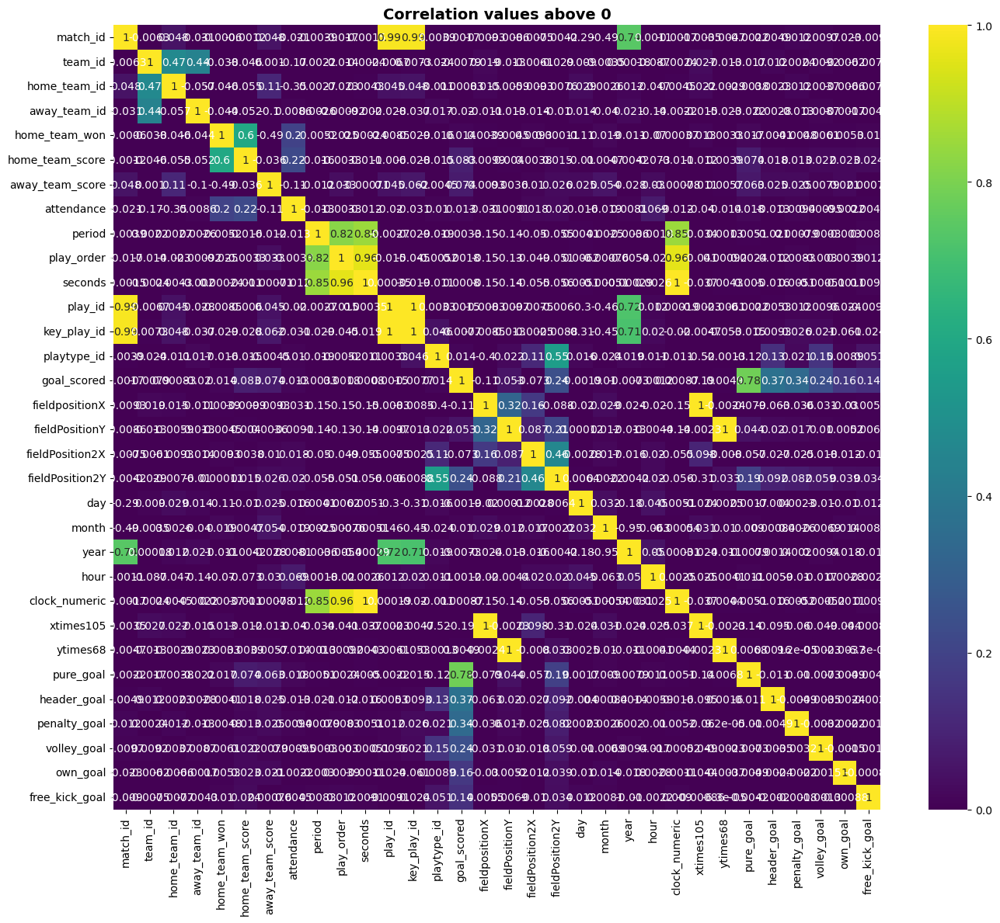

In [16]:
# Look at correlations
corr1 = eplpitch.corr(numeric_only=True)

# Heatmap highlighting correlations above 0
fig,ax = plt.subplots(figsize=(14,12))
sns.heatmap(corr1, cmap='viridis', vmin=0, annot=True, ax=ax)
ax.set_title("Correlation values above 0", fontsize =14, weight='bold')
plt.tight_layout();

Relevant high positive correlations (>0.4) between:

* home_team_won and home_team_score = 0.68
* hour and key_play_id = 0.4, probably means that later games have more key plays
* playtype_id and fieldPosition2Y = 0.59
* pure_goal and goal_scored = 0.83
* header_goal and goal_scored = 0.37

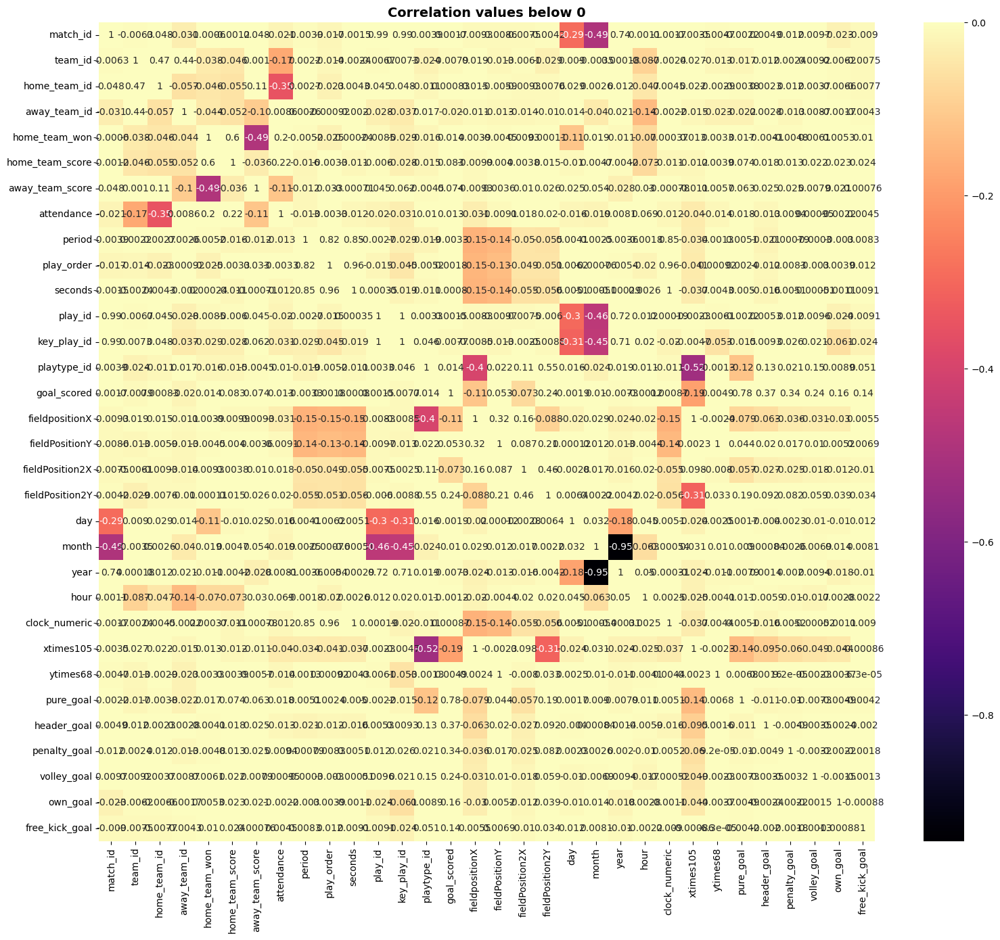

In [17]:
# Heatmap highlighting correlations below 0
fig,ax = plt.subplots(figsize=(16,14))
sns.heatmap(corr1, cmap='magma', vmax= 0., annot=True, ax=ax)
ax.set_title("Correlation values below 0", fontsize =14, weight='bold')
plt.tight_layout();

Relevant high negative correlations between:
* home_team_won and away_team_score = -0.5
* play_type_id and fieldpositionX = -0.39, not sure of the relevance of this correlation


## Most relevant correlations for our analysis are:
* playtype_id and fieldpositionX
* pure_goals and goal_scored
* header and goal_scored
* unfortunately, it does not seems that exact time of the match has many high correlations

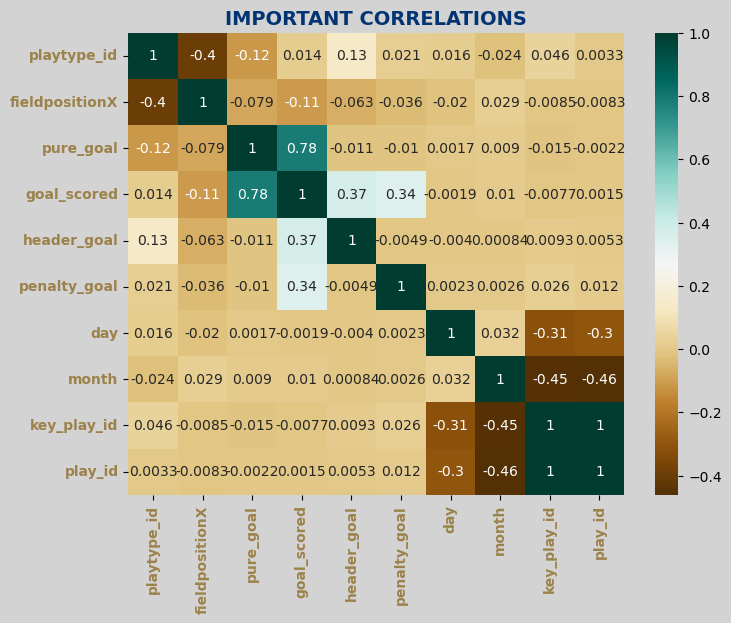

In [20]:
# Correlation map only including the values that will be relevant to analyzing goals
corr4 = eplpitch[['playtype_id','fieldpositionX','pure_goal','goal_scored','header_goal','penalty_goal','day','month','key_play_id', 'play_id']].corr()

fig,ax = plt.subplots(figsize=(8,6), facecolor='lightgray')

sns.heatmap(data=corr4, cmap='BrBG', annot=True, ax=ax)

ax.set_title("IMPORTANT CORRELATIONS", fontsize=14, weight='bold', color=arsenal_colors[0])
ax.set_xticklabels(labels=corr4.index, color=arsenal_colors[1], weight='bold')
ax.set_yticklabels(labels=corr4.index, color=arsenal_colors[1], weight='bold');

#### The main question is when and where are goals happening
* Though there are no relevant correlations to answer the when, we will still like to see a map of the distribution of goals over match duration

#### Later Analysis will look at:
* Field positions and play types along with goals scored to help us analyze where goals were scored from and the way those goals were scored

#### Let's start by creating a new variable that only has rows where goals were scored

In [21]:
# group data only to when a goal was scored
goal_scored = eplpitch[eplpitch["goal_scored"]==1]
goal_scored.info()

<class 'pandas.core.frame.DataFrame'>
Index: 538 entries, 9496 to 5007
Data columns (total 39 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   match_id         538 non-null    int64         
 1   game_date        538 non-null    datetime64[ns]
 2   team_name        538 non-null    object        
 3   team_abb         538 non-null    object        
 4   team_id          538 non-null    int64         
 5   home_team_id     538 non-null    int64         
 6   away_team_id     538 non-null    int64         
 7   home_team_won    538 non-null    bool          
 8   home_team_score  538 non-null    int64         
 9   away_team_score  538 non-null    int64         
 10  attendance       538 non-null    int64         
 11  period           538 non-null    int64         
 12  play_order       538 non-null    int64         
 13  clock            538 non-null    object        
 14  seconds          538 non-null    int64     

This change reduces our data to 691 columns

We will lok at a distribution plot with KDE lines for distribution

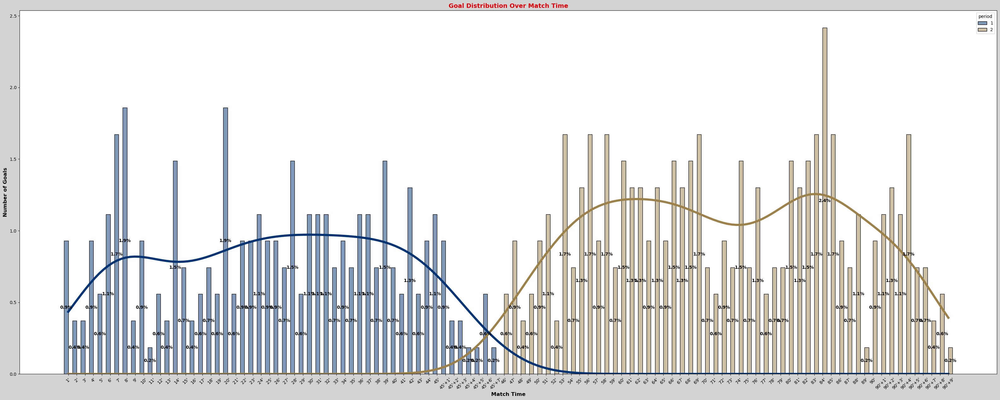

In [22]:
# Plot using the sorted data
fig, ax = plt.subplots(figsize=(40, 15), facecolor='lightgray')
sns.histplot(data=goal_scored, x='clock', 
             hue='period', multiple="dodge", stat='percent', 
             palette=arsenal_colors, ax=ax, kde=True, 
             line_kws={'linewidth':5})

# Labels and Title
ax.set_xlabel("Match Time", fontsize=12, weight='bold')
ax.set_ylabel("Number of Goals", fontsize=12, weight='bold')
ax.set_title("Goal Distribution Over Match Time", fontsize=14, weight='bold', color=arsenal_colors[3])
ax.tick_params(axis='x', rotation=45)

for p in ax.patches:
    height = p.get_height()
    if height > 0:
        ax.text(p.get_x() + p.get_width()/2, height/2, f'{height:.1f}%',
                ha='center', va='center', fontsize=10, color='black', fontweight='bold')

plt.show()

The KDE on this graph shows highest peaks around the 30 minute mark of the first half, and the 57 minute mark of the second half. There is an individual highest peak of the histogram at the 87th minute mark that accounts for 2.2% of the goals.

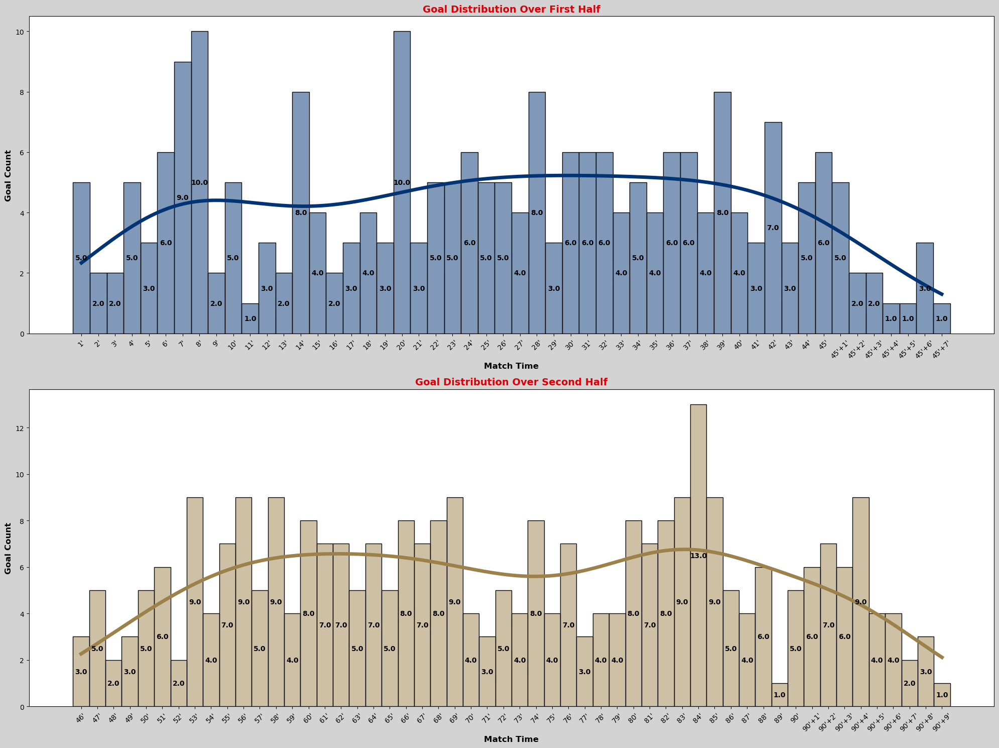

In [23]:
# Divided the halves into two graphs
fig,axs = plt.subplots(2,1, figsize=(20,15), facecolor='lightgray')

# 1st half 

first_half = (goal_scored[goal_scored['clock_numeric']<46])

sns.histplot(data=first_half, x='clock', multiple="stack", ax=axs[0], stat='count',color=arsenal_colors[0], kde=True, 
             line_kws={'linewidth':5})

axs[0].set_xlabel("Match Time", fontsize=12, weight='bold')
axs[0].set_ylabel("Goal Count", fontsize=12, weight='bold')
axs[0].set_title("Goal Distribution Over First Half", fontsize=14, weight='bold', color=arsenal_colors[3])
axs[0].tick_params(axis='x', rotation=45)

for p in axs[0].patches:
    height = p.get_height()
    if height > 0:
        axs[0].text(p.get_x() + p.get_width()/2, height/2, f'{height:.1f}',
                ha='center', va='center', fontsize=10, color='black', fontweight='bold')

# 2nd half
second_half = (goal_scored[goal_scored['clock_numeric']>=46])

sns.histplot(data=second_half, x='clock', multiple="stack", stat='count', color=arsenal_colors[1], ax=axs[1], kde=True, 
             line_kws={'linewidth':5})

axs[1].set_xlabel("Match Time", fontsize=12, weight='bold')
axs[1].set_ylabel("Goal Count", fontsize=12, weight='bold')
axs[1].set_title("Goal Distribution Over Second Half", fontsize=14, weight='bold', color=arsenal_colors[3])
axs[1].tick_params(axis='x', rotation=45)
                  
for p in axs[1].patches:
    height = p.get_height()
    if height > 0:
        axs[1].text(p.get_x() + p.get_width()/2, height/2, f'{height:.1f}',
                ha='center', va='center', fontsize=10, color='black', fontweight='bold')

plt.tight_layout();

Separating the graphs, we see the same distributions for each half. We can see that the 87th minute mark also accounts for 15 goals, which is 2.2% of all goals scored. 

#### Conclusion: The graphs experience a fairlly normal distribution without much skewness. There does not seem to be any extreme irregularities to show a more predictable minute to score. The KDE line does show the probability of values across the match, with some high peaks around the 30 minute mark of the first half, and the 57 minute mark of the second half. There is an individual highest peak of the histogram at the 87th minute mark that accounts for 2.2% of the goals.

Now that we have an idea of the minute of the game that goals are likely to happen. Let's find the positions where players are scoring.

In [24]:
# find the top 10 strikers
top_strikers = goal_scored.groupby('player')['goal_scored'].sum().reset_index(name='goals').sort_values(by='goals', ascending=False).head(10)
top_strikers

,player,goals
28,Antoine Griezmann,11.0
27,Ante Budimir,11.0
142,Kylian Mbappé,10.0
17,Alexander Sørloth,10.0
143,Lamine Yamal,9.0
136,Jude Bellingham,9.0
39,Ayoze Pérez,9.0
106,Iago Aspas,8.0
114,Iñaki Williams,8.0
79,Dodi Lukebakio,8.0


In [25]:
# group the top 5 scoring teams

top5_striker_teams= goal_scored[goal_scored['team_name'].isin(['Arsenal','Manchester City','Liverpool','AFC Bournemouth','Nottingham Forest'])]

## The next few lines will play with a few things to see what cool information we find. None of is being included in the findings of this project, but may be used for other insights later on. 
## Feel free to skip down to the next line where it says: "Analysis Continued"

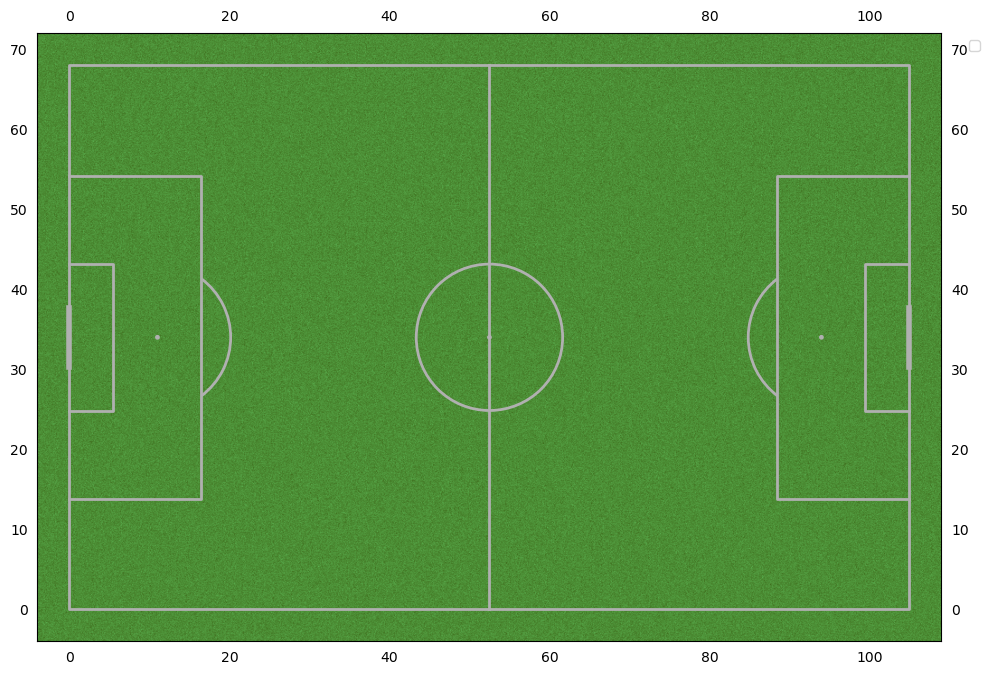

In [26]:
# goals scored by top 10 players
players_goals = {
    "Alexander Isak": 21.0,
    "Bryan Mbeumo": 19.0,
    "Cole Palmer": 19.0,
    "Erling Haaland": 18.0,
    "Bukayo Saka": 14.0,
    "Mohamed Salah": 14.0,
    "Chris Wood": 12.0,
    "Justin Kluivert": 12.0,
    "Amad": 11.0,
    "Anthony Elanga": 11.0
}

top10_strikers = goal_scored[goal_scored['player'].isin(['Alexander Isak', 'Bryan Mbeumo', 'Cole Palmer', 'Erling Haaland', 'Bukayo Saka',
                                                         'Mohamed Salah', 'Chris Wood','Justin Kluivert','Amad','Anthony Elanga'])]

top10_strikers['goal_size'] = top10_strikers['player'].map(players_goals)



pitch = Pitch(pitch_type='custom', pitch_color='grass', pitch_width=68, pitch_length=105,
              axis=True, label=True)

fig, ax = pitch.draw(figsize=(10,8))

# scatterplot of goals 
sns.scatterplot(data=top10_strikers, x='xtimes105', y='ytimes68', hue='player', size = 'goal_size', palette= 'magma', ax=ax)
ax.legend(bbox_to_anchor=(1.05,1));

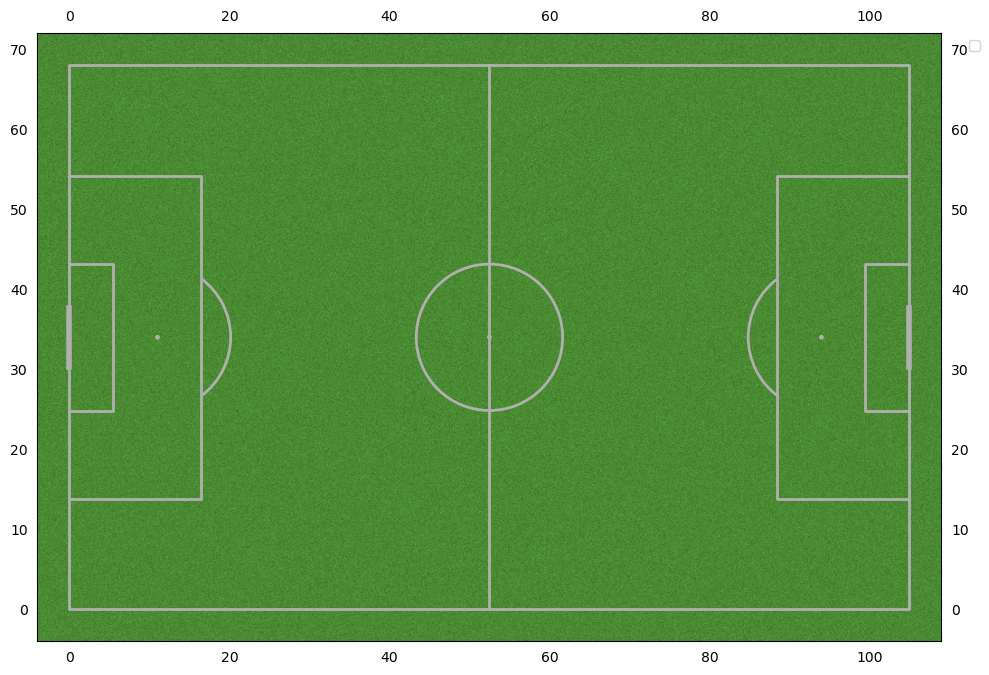

In [27]:
# goals scored by top 5 teams

# draw pitch of length 105, and width 68
# use mpl soccer pitch function

pitch = Pitch(pitch_type='custom', pitch_color='grass', pitch_width=68, pitch_length=105,
              axis=True, label=True)

fig, ax = pitch.draw(figsize=(10,8))

# scatterplot of goals 
sns.scatterplot(data=top5_striker_teams, x='xtimes105', y='ytimes68', hue='team_name', palette= 'magma', ax=ax)
ax.legend(bbox_to_anchor=(1.05,1));


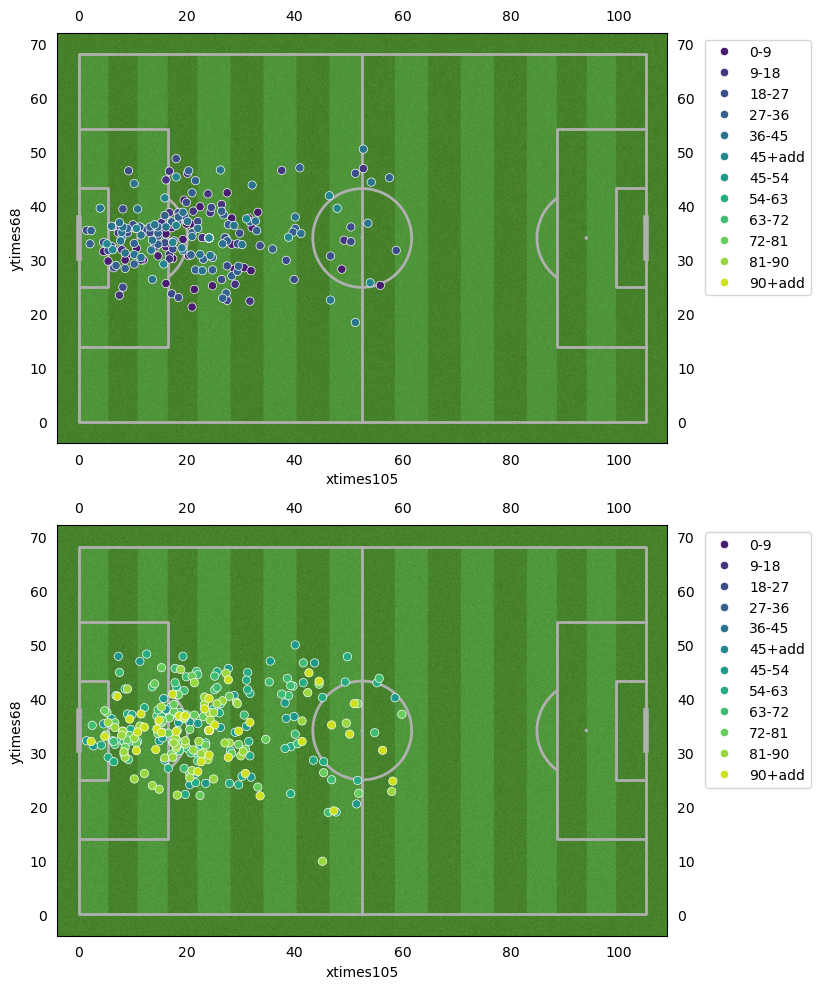

In [28]:
# goals scored between each half

pitch = Pitch(pitch_type='custom', pitch_width=68, pitch_length=105,
              axis=True, label=True, pitch_color='grass', stripe_color=arsenal_colors[0], stripe=True)

fig, axs = pitch.draw(figsize=(14,10), nrows=2, ncols=1)

goal_scored_1half = goal_scored[goal_scored['period'] == 1]
sns.scatterplot(data=goal_scored_1half, x='xtimes105', y='ytimes68', hue='clock_binned', palette='viridis', ax=axs[0])
axs[0].legend(bbox_to_anchor=(1.05,1))
# axs[0].get_legend().remove()

goal_scored_2half = goal_scored[goal_scored['period']==2]
sns.scatterplot(data=goal_scored_2half, x='xtimes105', y='ytimes68', hue='clock_binned', palette='viridis', ax=axs[1])
axs[1].legend(bbox_to_anchor=(1.05,1));


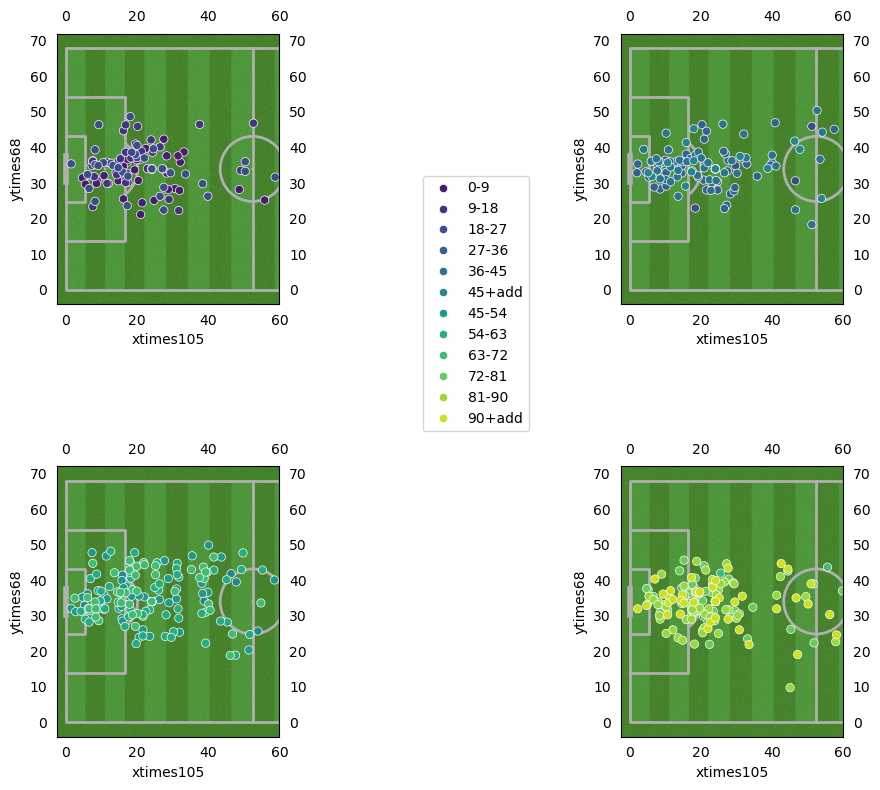

In [29]:
# goals scored during each quarter
# pitch = Pitch(pitch_type='custom', pitch_width=68, pitch_length=105,
#               axis=True, label=True, pitch_color='grass', stripe_color='green', stripe=True)

# fig, axs = pitch.draw(figsize=(14,10), nrows=2, ncols=2)


pitch = Pitch(half=True, pad_left=55, pad_right=-45, pitch_type='custom', pitch_width=68, pitch_length=105,
              axis=True, label=True, pitch_color='grass', stripe_color='green', stripe=True)
fig, axs = pitch.draw(figsize=(10,8), nrows=2, ncols=2)
fig.subplots_adjust(wspace=0, hspace=0)


goal_scored_1qt = goal_scored[goal_scored['clock_numeric'] <= 25]
sns.scatterplot(data=goal_scored_1qt, x='xtimes105', y='ytimes68', hue='clock_binned', palette='viridis', ax=axs[0,0])
axs[0,0].legend(bbox_to_anchor=(1.615,0.5))
# axs[0].get_legend().remove()

goal_scored_2qt = goal_scored[(goal_scored['clock_numeric'] > 25) & (goal_scored['clock_numeric'] < 46)]
sns.scatterplot(data=goal_scored_2qt, x='xtimes105', y='ytimes68', hue='clock_binned', palette='viridis', ax=axs[0,1])
axs[0,1].get_legend().remove()

goal_scored_3qt = goal_scored[(goal_scored['clock_numeric'] >45) & (goal_scored['clock_numeric'] <= 70)]
sns.scatterplot(data=goal_scored_3qt, x='xtimes105', y='ytimes68', hue='clock_binned', palette='viridis', ax=axs[1,0])
axs[1,0].get_legend().remove()

goal_scored_4qt = goal_scored[goal_scored['clock_numeric'] > 70]
sns.scatterplot(data=goal_scored_4qt, x='xtimes105', y='ytimes68', hue='clock_binned', palette='viridis', ax=axs[1,1])
axs[1,1].get_legend().remove()



AttributeError: 'NoneType' object has no attribute 'remove'

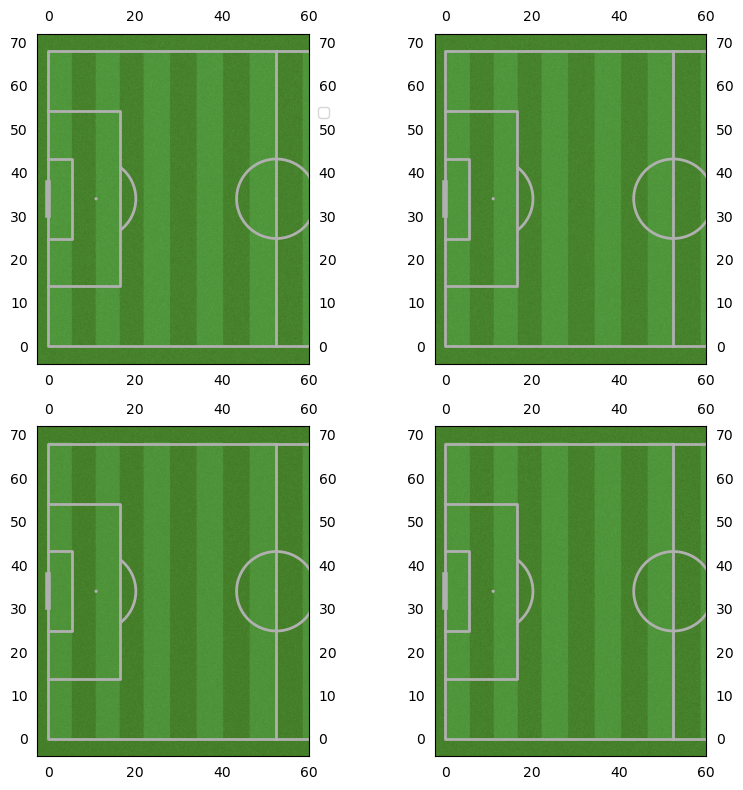

In [30]:
# top 5 strikers by quarter
pitch = Pitch(half=True, pad_left=55, pad_right=-45, pitch_type='custom', pitch_width=68, pitch_length=105,
              axis=True, label=True, pitch_color='grass', stripe_color='arsenal_colors[0]', stripe=True)

fig, axs = pitch.draw(figsize=(10,8), nrows=2, ncols=2)
fig.subplots_adjust(wspace=0, hspace=0)

goal_scored_1qt = top10_strikers[top10_strikers['clock_numeric'] <= 25]
sns.scatterplot(data=goal_scored_1qt, x='xtimes105', y='ytimes68', hue='player', palette='magma', ax=axs[0,0])
axs[0,0].legend(bbox_to_anchor=(1.1,0.8))
# axs[0].get_legend().remove()

goal_scored_2qt = top10_strikers[(top10_strikers['clock_numeric'] > 25) & (top10_strikers['clock_numeric'] < 46)]
sns.scatterplot(data=goal_scored_2qt, x='xtimes105', y='ytimes68', hue='player', palette='magma', ax=axs[0,1])
axs[0,1].get_legend().remove()

goal_scored_3qt = top10_strikers[(top10_strikers['clock_numeric'] >45) & (top10_strikers['clock_numeric'] <= 70)]
sns.scatterplot(data=goal_scored_3qt, x='xtimes105', y='ytimes68', hue='player', palette='magma', ax=axs[1,0])
axs[1,0].get_legend().remove()

goal_scored_4qt = top10_strikers[top10_strikers['clock_numeric'] > 70]
sns.scatterplot(data=goal_scored_4qt, x='xtimes105', y='ytimes68', hue='player', palette='magma', ax=axs[1,1])
axs[1,1].get_legend().remove();

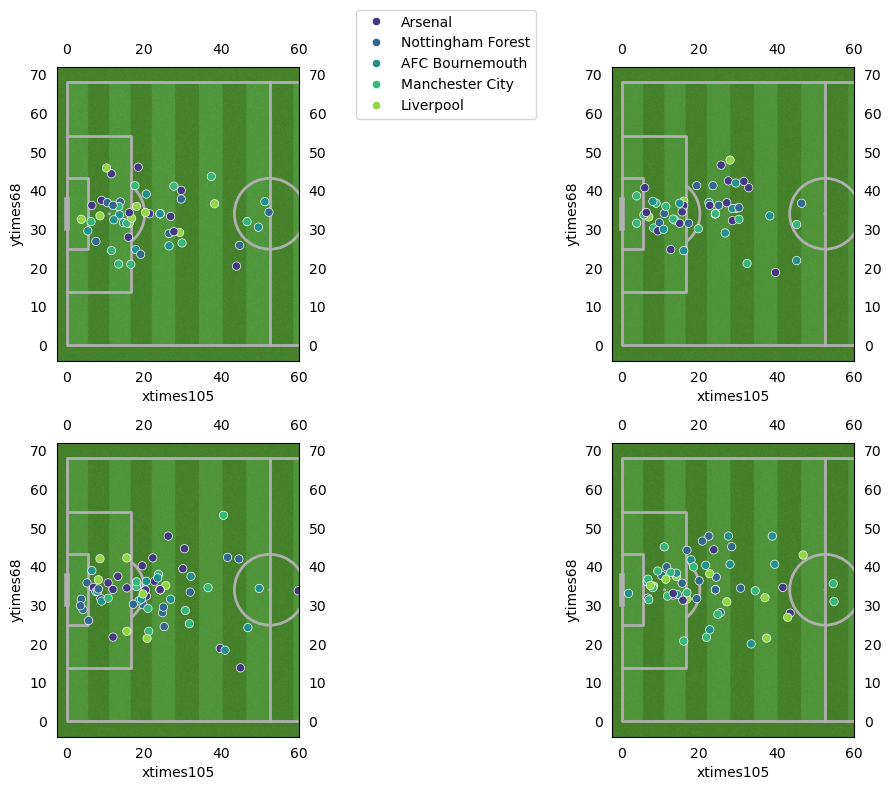

In [ ]:
# top 5 teams by quarter
pitch = Pitch(half=True, pad_left=55, pad_right=-45, pitch_type='custom', pitch_width=68, pitch_length=105,
              axis=True, label=True, pitch_color='grass', stripe_color='arsenal_colors[0]', stripe=True)

fig, axs = pitch.draw(figsize=(10,8), nrows=2, ncols=2)
fig.subplots_adjust(wspace=0, hspace=0)

goal_scored_1qt = top5_striker_teams[top5_striker_teams['clock_numeric'] <= 25]
sns.scatterplot(data=goal_scored_1qt, x='xtimes105', y='ytimes68', hue='team_name', palette='viridis', ax=axs[0,0])
axs[0,0].legend(bbox_to_anchor=(1.21,0.8))
# axs[0].get_legend().remove()

goal_scored_2qt = top5_striker_teams[(top5_striker_teams['clock_numeric'] > 25) & (top5_striker_teams['clock_numeric'] < 46)]
sns.scatterplot(data=goal_scored_2qt, x='xtimes105', y='ytimes68', hue='team_name', palette='viridis', ax=axs[0,1])
axs[0,1].get_legend().remove()

goal_scored_3qt = top5_striker_teams[(top5_striker_teams['clock_numeric'] >45) & (top5_striker_teams['clock_numeric'] <= 70)]
sns.scatterplot(data=goal_scored_3qt, x='xtimes105', y='ytimes68', hue='team_name', palette='viridis', ax=axs[1,0])
axs[1,0].get_legend().remove()

goal_scored_4qt = top5_striker_teams[top5_striker_teams['clock_numeric'] > 70]
sns.scatterplot(data=goal_scored_4qt, x='xtimes105', y='ytimes68', hue='team_name', palette='viridis', ax=axs[1,1])
axs[1,1].get_legend().remove();

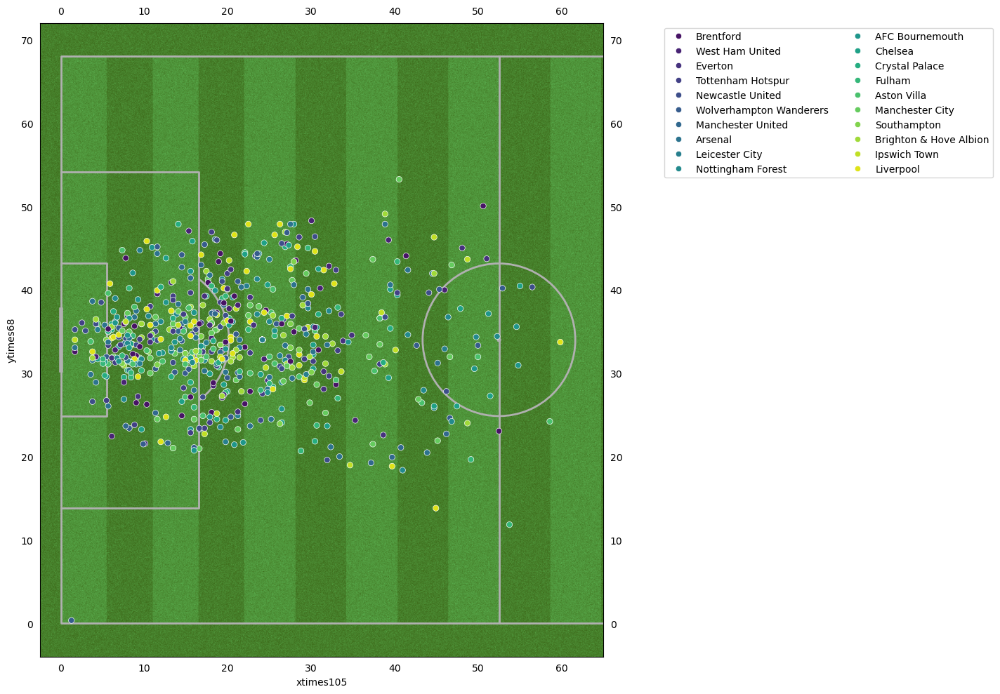

In [ ]:
#goals scored by all teams

pitch = Pitch(half=True, pad_left=55, pad_right=-40, pitch_type='custom', pitch_width=68, pitch_length=105,
              axis=True, label=True, pitch_color='grass', stripe_color='green', stripe=True)

fig, ax = pitch.draw(figsize=(14,10))
sns.scatterplot(data=goal_scored, x='xtimes105', y='ytimes68', hue='team_name', palette= 'viridis', ax=ax)

ax.legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=2);


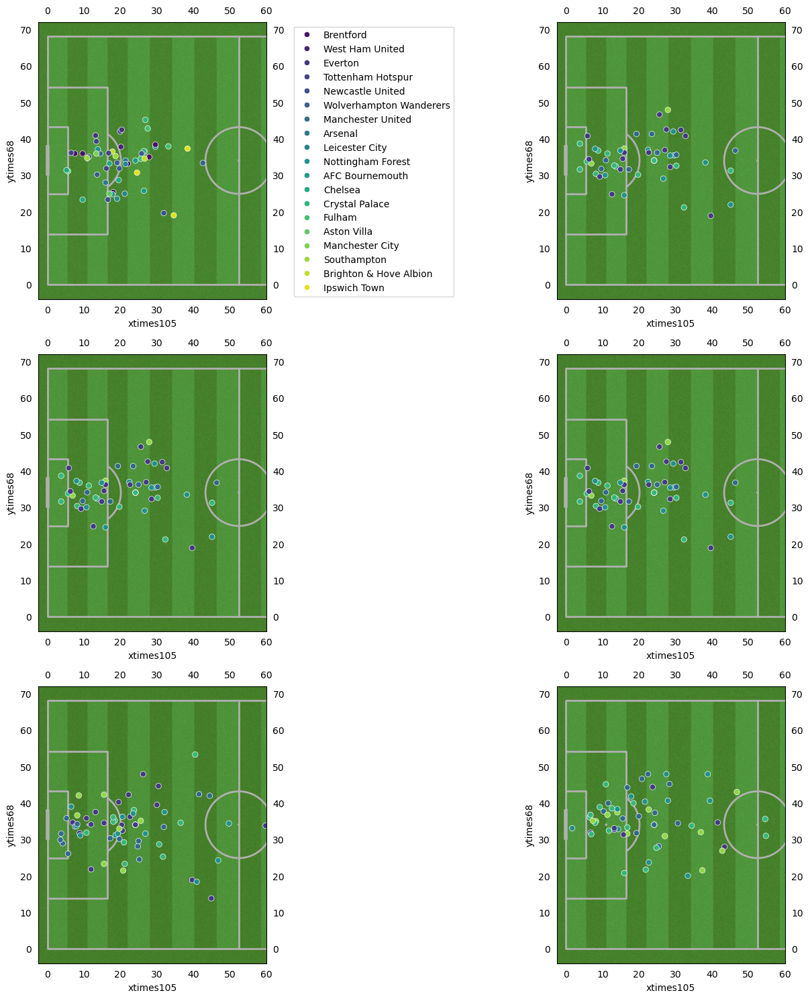

In [ ]:
# goals scored every 15m
pitch = Pitch(half=True, pad_left=55, pad_right=-45, pitch_type='custom', pitch_width=68, pitch_length=105,
              axis=True, label=True, pitch_color='grass', stripe_color='arsenal_colors[0]', stripe=True)


fig, axs = pitch.draw(figsize=(18,15), nrows=3, ncols=2)
fig.subplots_adjust(wspace=0, hspace=0)

goal_scored_15m = goal_scored[goal_scored['clock_numeric'] < 9]
sns.scatterplot(data=goal_scored_15m, x='xtimes105', y='ytimes68', hue='team_name', palette='viridis', ax=axs[0,0])
# axs[0,0].get_legend().remove()
axs[0,0].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)

goal_scored_30m = goal_scored[(goal_scored['clock_numeric'] > 15) & (goal_scored['clock_numeric'] <= 30)]
sns.scatterplot(data=goal_scored_2qt, x='xtimes105', y='ytimes68', hue='team_name', palette='viridis', ax=axs[0,1])
# axs[0,1].get_legend().remove()
axs[0,1].get_legend().remove()


goal_scored_45m = goal_scored[(goal_scored['clock_numeric'] > 30) & (goal_scored['clock_numeric'] < 46)]
sns.scatterplot(data=goal_scored_2qt, x='xtimes105', y='ytimes68', hue='team_name', palette='viridis', ax=axs[1,0])
axs[1,0].get_legend().remove()

goal_scored_60m = goal_scored[(goal_scored['clock_numeric'] > 45) & (goal_scored['clock_numeric'] <= 60)]
sns.scatterplot(data=goal_scored_2qt, x='xtimes105', y='ytimes68', hue='team_name', palette='viridis', ax=axs[1,1])
axs[1,1].get_legend().remove()

goal_scored_75m = goal_scored[(goal_scored['clock_numeric'] > 60) & (goal_scored['clock_numeric'] <= 75)]
sns.scatterplot(data=goal_scored_3qt, x='xtimes105', y='ytimes68', hue='team_name', palette='viridis', ax=axs[2,0])
axs[2,0].get_legend().remove()

goal_scored_90m = goal_scored[goal_scored['clock_numeric'] > 75]
sns.scatterplot(data=goal_scored_4qt, x='xtimes105', y='ytimes68', hue='team_name', palette='viridis', ax=axs[2,1])
axs[2,1].get_legend().remove();

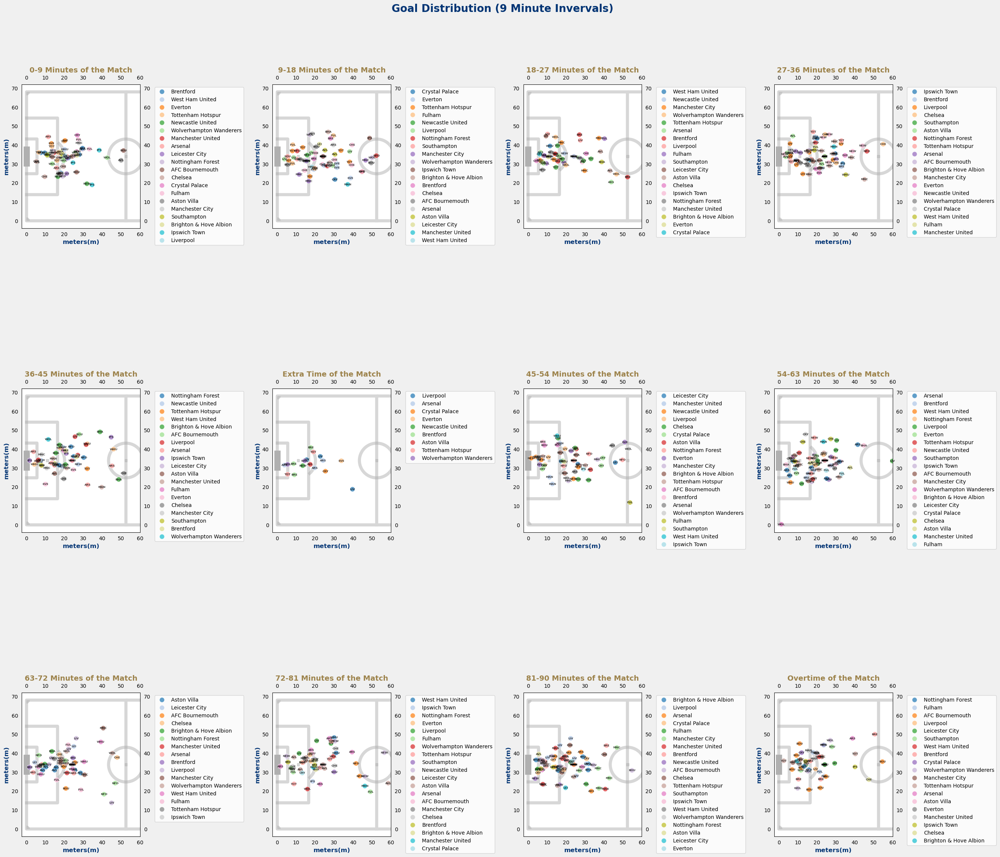

In [ ]:
# goals, 9m, hue=teams
# create pitch
pitch = Pitch(half=True, pad_left=55, pad_right=-45, 
              pitch_type='custom', corner_arcs=True, 
              pitch_width=68, pitch_length=105, axis=True, label=True, 
              line_alpha=0.5, linewidth=6,
              spot_type='square', spot_scale=0.006)

fig, axs = pitch.draw(figsize=(27,25), nrows=3, ncols=4)
# fig.subplots_adjust(wspace=0, hspace=0)

# Set the background color for the figure
fig.patch.set_facecolor('#F0F0F0')  

### 1st half

# 0-9m of the match
goal_scored_9m = goal_scored[goal_scored['clock_numeric'] < 10]
sns.scatterplot(data=goal_scored_9m, x='xtimes105', y='ytimes68', s=90, hue='team_name', palette='tab20', alpha=0.7, ax=axs[0,0])
axs[0,0].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[0,0].set_title('0-9 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,0].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,0].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_9m.iterrows():
    axs[0,0].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


# 9-18m of the match
goal_scored_18m = goal_scored[(goal_scored['clock_numeric'] >10) & (goal_scored['clock_numeric'] <= 18)]
sns.scatterplot(data=goal_scored_18m, x='xtimes105', y='ytimes68', s=90, hue='team_name', palette='tab20', alpha=0.7, ax=axs[0,1])
axs[0,1].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[0,1].set_title('9-18 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,1].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,1].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_18m.iterrows():
    axs[0,1].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )

# 18-27m of the match
goal_scored_27m = goal_scored[(goal_scored['clock_numeric'] > 18) & (goal_scored['clock_numeric'] <= 27)]
sns.scatterplot(data=goal_scored_27m, x='xtimes105', y='ytimes68', s=90, hue='team_name', palette='tab20', alpha=0.7, ax=axs[0,2])
axs[0,2].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[0,2].set_title('18-27 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,2].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,2].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_27m.iterrows():
    axs[0,2].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


# 27-36m of the match
goal_scored_36m = goal_scored[(goal_scored['clock_numeric'] > 27) & (goal_scored['clock_numeric'] <= 36)]
sns.scatterplot(data=goal_scored_36m, x='xtimes105', y='ytimes68', s=90, hue='team_name', palette='tab20', alpha=0.7, ax=axs[0,3])
axs[0,3].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[0,3].set_title('27-36 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,3].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,3].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_36m.iterrows():
    axs[0,3].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


# 36-45m of the match
goal_scored_45m = goal_scored[(goal_scored['clock_numeric'] > 36) & (goal_scored['clock_numeric'] <= 45)]
sns.scatterplot(data=goal_scored_45m, x='xtimes105', y='ytimes68', s=90, hue='team_name', palette='tab20', alpha=0.7, ax=axs[1,0])
axs[1,0].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[1,0].set_title('36-45 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,0].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,0].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_45m.iterrows():
    axs[1,0].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


# 45 + et of the match
goal_scored_extra1 = goal_scored[(goal_scored['clock_numeric'] > 45) & (goal_scored['clock_numeric'] < 46)]
sns.scatterplot(data=goal_scored_extra1, x='xtimes105', y='ytimes68', s=90, hue='team_name', palette='tab20', alpha=0.7, ax=axs[1,1])
axs[1,1].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[1,1].set_title('Extra Time of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,1].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,1].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_extra1.iterrows():
    axs[1,1].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )

    
### Second Half

# 45-54 of the match
goal_scored_54m = goal_scored[(goal_scored['clock_numeric'] >= 46) & (goal_scored['clock_numeric'] < 54)]
sns.scatterplot(data=goal_scored_54m, x='xtimes105', y='ytimes68', s=90, hue='team_name', palette='tab20', alpha=0.7, ax=axs[1,2])
axs[1,2].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[1,2].set_title('45-54 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,2].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,2].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_54m.iterrows():
    axs[1,2].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


# 54-63m of the match
goal_scored_63m = goal_scored[(goal_scored['clock_numeric'] >= 54) & (goal_scored['clock_numeric'] < 63)]
sns.scatterplot(data=goal_scored_63m, x='xtimes105', y='ytimes68', s=90, hue='team_name', palette='tab20', alpha=0.7, ax=axs[1,3])
axs[1,3].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[1,3].set_title('54-63 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,3].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,3].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_63m.iterrows():
    axs[1,3].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


# 63-72m of the match
goal_scored_72m = goal_scored[(goal_scored['clock_numeric'] >= 63) & (goal_scored['clock_numeric'] < 72)]
sns.scatterplot(data=goal_scored_72m, x='xtimes105', y='ytimes68', s=90, hue='team_name', palette='tab20', alpha=0.7, ax=axs[2,0])
axs[2,0].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[2,0].set_title('63-72 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,0].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,0].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_72m.iterrows():
    axs[2,0].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


# 72-81m of the match
goal_scored_81m = goal_scored[(goal_scored['clock_numeric'] >=72) & (goal_scored['clock_numeric'] < 81)]
sns.scatterplot(data=goal_scored_81m, x='xtimes105', y='ytimes68', s=90, hue='team_name', palette='tab20', alpha=0.7, ax=axs[2,1])
axs[2,1].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[2,1].set_title('72-81 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,1].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,1].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_81m.iterrows():
    axs[2,1].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


# 81-90m of the match
goal_scored_90m = goal_scored[(goal_scored['clock_numeric'] >=81) & (goal_scored['clock_numeric'] <= 90)]
sns.scatterplot(data=goal_scored_90m, x='xtimes105', y='ytimes68', s=90, hue='team_name', palette='tab20', alpha=0.7, ax=axs[2,2])
axs[2,2].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[2,2].set_title('81-90 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,2].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,2].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_90m.iterrows():
    axs[2,2].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


# 90 + et of the match
goal_scored_extra2 = goal_scored[goal_scored['clock_numeric'] > 90]
sns.scatterplot(data=goal_scored_extra2, x='xtimes105', y='ytimes68', s=90, hue='team_name', palette='tab20', alpha=0.7, ax=axs[2,3])
axs[2,3].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[2,3].set_title('Overtime of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,3].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,3].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_extra2.iterrows():
    axs[2,3].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


fig.suptitle('Goal Distribution (9 Minute Invervals)', fontsize = 20, weight='bold', color=arsenal_colors[0])

plt.tight_layout();


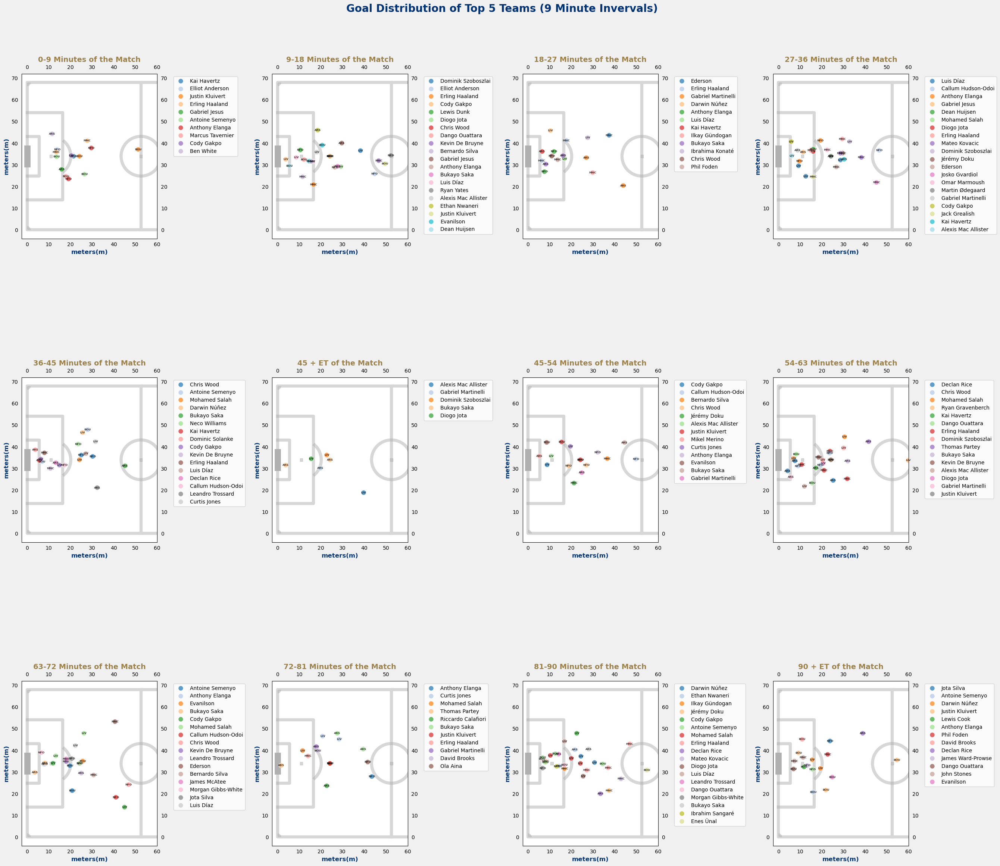

In [ ]:
# goals, 9m, hue=top 5 teams

# create pitch
pitch = Pitch(half=True, pad_left=55, pad_right=-45, 
              pitch_type='custom', corner_arcs=True, 
              pitch_width=68, pitch_length=105, axis=True, label=True, 
              line_alpha=0.5, linewidth=6,
              spot_type='square', spot_scale=0.006)

fig, axs = pitch.draw(figsize=(27,25), nrows=3, ncols=4)
# fig.subplots_adjust(wspace=0, hspace=0)

# Set the background color for the figure
fig.patch.set_facecolor('#F0F0F0')  

### 1st half

# 0-9m of the match
goal_scored_9m = top5_striker_teams[top5_striker_teams['clock_numeric'] < 10]
sns.scatterplot(data=goal_scored_9m, x='xtimes105', y='ytimes68', s=90, hue='player', palette='tab20', alpha=0.7, ax=axs[0,0])
axs[0,0].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[0,0].set_title('0-9 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,0].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,0].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_9m.iterrows():
    axs[0,0].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


# 9-18m of the match
goal_scored_18m = top5_striker_teams[(top5_striker_teams['clock_numeric'] >10) & (top5_striker_teams['clock_numeric'] <= 18)]
sns.scatterplot(data=goal_scored_18m, x='xtimes105', y='ytimes68', s=90, hue='player', palette='tab20', alpha=0.7, ax=axs[0,1])
axs[0,1].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[0,1].set_title('9-18 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,1].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,1].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_18m.iterrows():
    axs[0,1].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )

# 18-27m of the match
goal_scored_27m = top5_striker_teams[(top5_striker_teams['clock_numeric'] > 18) & (top5_striker_teams['clock_numeric'] <= 27)]
sns.scatterplot(data=goal_scored_27m, x='xtimes105', y='ytimes68', s=90, hue='player', palette='tab20', alpha=0.7, ax=axs[0,2])
axs[0,2].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[0,2].set_title('18-27 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,2].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,2].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_27m.iterrows():
    axs[0,2].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


# 27-36m of the match
goal_scored_36m = top5_striker_teams[(top5_striker_teams['clock_numeric'] > 27) & (top5_striker_teams['clock_numeric'] <= 36)]
sns.scatterplot(data=goal_scored_36m, x='xtimes105', y='ytimes68', s=90, hue='player', palette='tab20', alpha=0.7, ax=axs[0,3])
axs[0,3].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[0,3].set_title('27-36 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,3].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,3].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_36m.iterrows():
    axs[0,3].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


# 36-45m of the match
goal_scored_45m = top5_striker_teams[(top5_striker_teams['clock_numeric'] > 36) & (top5_striker_teams['clock_numeric'] <= 45)]
sns.scatterplot(data=goal_scored_45m, x='xtimes105', y='ytimes68', s=90, hue='player', palette='tab20', alpha=0.7, ax=axs[1,0])
axs[1,0].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[1,0].set_title('36-45 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,0].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,0].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_45m.iterrows():
    axs[1,0].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


# 45 + et of the match
goal_scored_extra1 = top5_striker_teams[(top5_striker_teams['clock_numeric'] > 45) & (top5_striker_teams['clock_numeric'] < 46)]
sns.scatterplot(data=goal_scored_extra1, x='xtimes105', y='ytimes68', s=90, hue='player', palette='tab20', alpha=0.7, ax=axs[1,1])
axs[1,1].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[1,1].set_title('45 + ET of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,1].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,1].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_extra1.iterrows():
    axs[1,1].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )

    
### Second Half

# 45-54 of the match
goal_scored_54m = top5_striker_teams[(top5_striker_teams['clock_numeric'] >= 46) & (top5_striker_teams['clock_numeric'] < 54)]
sns.scatterplot(data=goal_scored_54m, x='xtimes105', y='ytimes68', s=90, hue='player', palette='tab20', alpha=0.7, ax=axs[1,2])
axs[1,2].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[1,2].set_title('45-54 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,2].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,2].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_54m.iterrows():
    axs[1,2].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


# 54-63m of the match
goal_scored_63m = top5_striker_teams[(top5_striker_teams['clock_numeric'] >= 54) & (top5_striker_teams['clock_numeric'] < 63)]
sns.scatterplot(data=goal_scored_63m, x='xtimes105', y='ytimes68', s=90, hue='player', palette='tab20', alpha=0.7, ax=axs[1,3])
axs[1,3].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[1,3].set_title('54-63 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,3].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,3].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_63m.iterrows():
    axs[1,3].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


# 63-72m of the match
goal_scored_72m = top5_striker_teams[(top5_striker_teams['clock_numeric'] >= 63) & (top5_striker_teams['clock_numeric'] < 72)]
sns.scatterplot(data=goal_scored_72m, x='xtimes105', y='ytimes68', s=90, hue='player', palette='tab20', alpha=0.7, ax=axs[2,0])
axs[2,0].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[2,0].set_title('63-72 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,0].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,0].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_72m.iterrows():
    axs[2,0].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


# 72-81m of the match
goal_scored_81m = top5_striker_teams[(top5_striker_teams['clock_numeric'] >=72) & (top5_striker_teams['clock_numeric'] < 81)]
sns.scatterplot(data=goal_scored_81m, x='xtimes105', y='ytimes68', s=90, hue='player', palette='tab20', alpha=0.7, ax=axs[2,1])
axs[2,1].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[2,1].set_title('72-81 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,1].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,1].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_81m.iterrows():
    axs[2,1].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


# 81-90m of the match
goal_scored_90m = top5_striker_teams[(top5_striker_teams['clock_numeric'] >=81) & (top5_striker_teams['clock_numeric'] <= 90)]
sns.scatterplot(data=goal_scored_90m, x='xtimes105', y='ytimes68', s=90, hue='player', palette='tab20', alpha=0.7, ax=axs[2,2])
axs[2,2].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[2,2].set_title('81-90 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,2].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,2].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_90m.iterrows():
    axs[2,2].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


# 90 + et of the match
goal_scored_extra2 = top5_striker_teams[top5_striker_teams['clock_numeric'] > 90]
sns.scatterplot(data=goal_scored_extra2, x='xtimes105', y='ytimes68', s=90, hue='player', palette='tab20', alpha=0.7, ax=axs[2,3])
axs[2,3].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[2,3].set_title('90 + ET of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,3].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,3].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

# Add team abbreviations to each point
for _, row in goal_scored_extra2.iterrows():
    axs[2,3].text(
        row['xtimes105'], row['ytimes68'], 
        row['team_abb'], 
        fontsize=5.5, color='black', ha='center', va='center', 
        fontweight='bold', alpha=0.7
    )


fig.suptitle('Goal Distribution of Top 5 Teams (9 Minute Invervals)', fontsize = 20, weight='bold', color=arsenal_colors[0])

plt.tight_layout();


# "Analysis Continued"

### We will start using the sorting_plays function to group all instances that a shot was taken, but it was not necessarily a goal

In [31]:
# using the function sorting plays to show all the shots taken, regardless of whether they were goals

eplpitch['all_shots'] = eplpitch['events'].apply(lambda x: sorting_plays(x))
just_shots = eplpitch[eplpitch['all_shots']==1]
just_shots.head(2)

,match_id,game_date,team_name,team_abb,team_id,home_team_id,away_team_id,home_team_won,home_team_score,away_team_score,...,clock_binned,xtimes105,ytimes68,pure_goal,header_goal,penalty_goal,volley_goal,own_goal,free_kick_goal,all_shots
4883,704741,2024-10-05 14:15:00,Osasuna,OSA,97,2922,97,False,1,1,...,0-9,NaN,NaN,0,0,0,0,0,0,1
11028,704843,2025-01-12 13:00:00,Getafe,GET,2922,98,2922,False,1,2,...,0-9,21.84,21.012,0,0,0,0,0,0,1


In [32]:
# changing the size of goals scored to better show the position of goals in our future scatter plots

just_shots["goal_scored_sized"] = just_shots["goal_scored"].replace({0: 10, 1: 100})
just_shots["goal_scored_sized"]

C:\Users\vchan\AppData\Local\Temp\ipykernel_28592\1178906603.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  just_shots["goal_scored_sized"] = just_shots["goal_scored"].replace({0: 10, 1: 100})


4883      10.0
11028     10.0
9496     100.0
5179     100.0
10921     10.0
         ...  
11329     10.0
4999      10.0
2603      10.0
2604      10.0
12963     10.0
Name: goal_scored_sized, Length: 4733, dtype: float64

#### Now, that those modifications have been made, we will start plotting a scatterplot of all shots taken vs goals scored between each 9 minute time interval

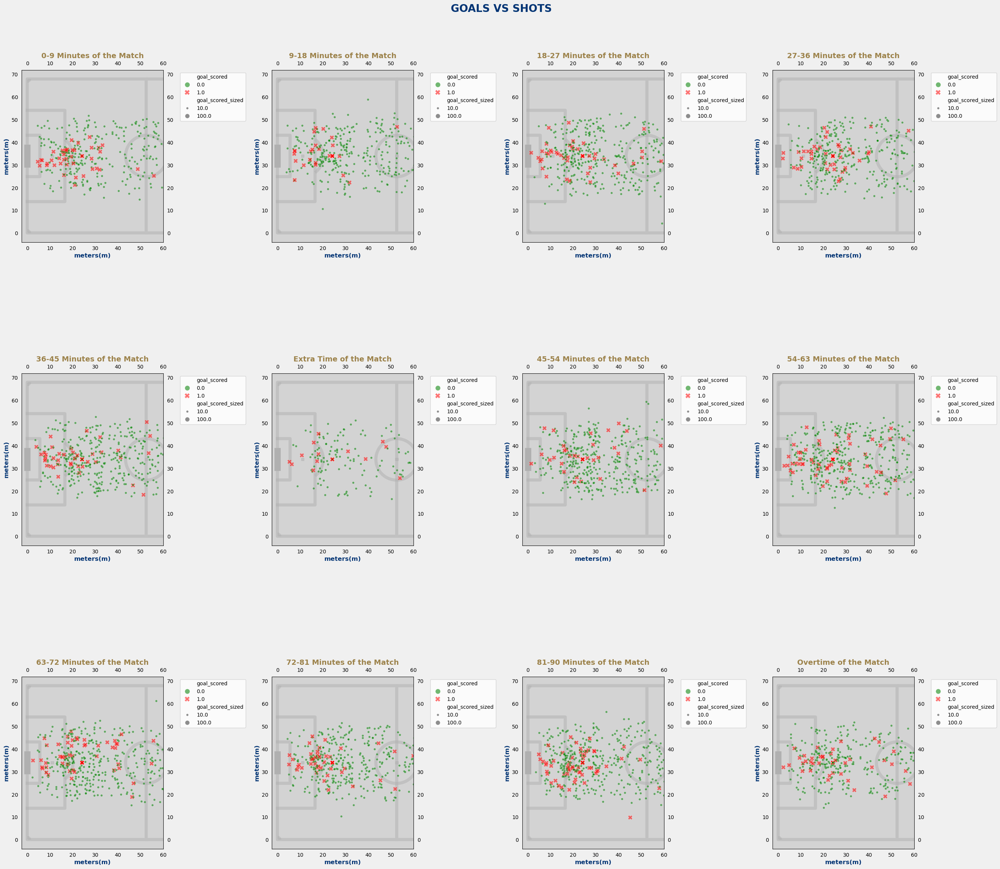

In [33]:
contrasting_colors = ['green', 'red']


# create pitch
pitch = Pitch(half=True, pad_left=55, pad_right=-45, 
              pitch_type='custom', corner_arcs=True, pitch_color='lightgray',
              pitch_width=68, pitch_length=105, axis=True, label=True, 
              line_alpha=0.5, linewidth=6,
              spot_type='square', spot_scale=0.006)

fig, axs = pitch.draw(figsize=(27,25), nrows=3, ncols=4)
# fig.subplots_adjust(wspace=0, hspace=0)

# Set the background color for the figure
fig.patch.set_facecolor('#F0F0F0')  

### 1st half

# 0-9m of the match
just_shots_9m = just_shots[just_shots['clock_numeric'] < 10]
sns.scatterplot(data=just_shots_9m, x='xtimes105', y='ytimes68', s=90, hue='goal_scored', palette=contrasting_colors, style='goal_scored', size='goal_scored_sized', alpha=0.55, ax=axs[0,0])
axs[0,0].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[0,0].set_title('0-9 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,0].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,0].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])


# 9-18m of the match
just_shots_18m = just_shots[(just_shots['clock_numeric'] >10) & (just_shots['clock_numeric'] <= 18)]
sns.scatterplot(data=just_shots_18m, x='xtimes105', y='ytimes68', s=90, hue='goal_scored', palette=contrasting_colors, style='goal_scored', size='goal_scored_sized', alpha=0.55, ax=axs[0,1])
axs[0,1].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[0,1].set_title('9-18 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,1].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,1].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])


# 18-27m of the match
just_shots_27m = just_shots[(just_shots['clock_numeric'] > 18) & (just_shots['clock_numeric'] <= 27)]
sns.scatterplot(data=just_shots_27m, x='xtimes105', y='ytimes68', s=90, hue='goal_scored', palette=contrasting_colors, style='goal_scored', size='goal_scored_sized', alpha=0.55, ax=axs[0,2])
axs[0,2].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[0,2].set_title('18-27 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,2].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,2].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])


# 27-36m of the match
just_shots_36m = just_shots[(just_shots['clock_numeric'] > 27) & (just_shots['clock_numeric'] <= 36)]
sns.scatterplot(data=just_shots_36m, x='xtimes105', y='ytimes68', s=90, hue='goal_scored', palette=contrasting_colors, style='goal_scored', size='goal_scored_sized', alpha=0.55, ax=axs[0,3])
axs[0,3].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[0,3].set_title('27-36 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,3].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,3].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])



# 36-45m of the match
just_shots_45m = just_shots[(just_shots['clock_numeric'] > 36) & (just_shots['clock_numeric'] <= 45)]
sns.scatterplot(data=just_shots_45m, x='xtimes105', y='ytimes68', s=90, hue='goal_scored', palette=contrasting_colors, style='goal_scored', size='goal_scored_sized', alpha=0.55, ax=axs[1,0])
axs[1,0].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[1,0].set_title('36-45 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,0].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,0].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])



# 45 + et of the match
just_shots_extra1 = just_shots[(just_shots['clock_numeric'] > 45) & (just_shots['clock_numeric'] < 46)]
sns.scatterplot(data=just_shots_extra1, x='xtimes105', y='ytimes68', s=90, hue='goal_scored', palette=contrasting_colors, style='goal_scored', size='goal_scored_sized', alpha=0.55, ax=axs[1,1])
axs[1,1].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[1,1].set_title('Extra Time of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,1].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,1].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])


    
### Second Half

# 45-54 of the match
just_shots_54m = just_shots[(just_shots['clock_numeric'] >= 46) & (just_shots['clock_numeric'] < 54)]
sns.scatterplot(data=just_shots_54m, x='xtimes105', y='ytimes68', s=90, hue='goal_scored', palette=contrasting_colors, style='goal_scored', size='goal_scored_sized', alpha=0.55, ax=axs[1,2])
axs[1,2].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[1,2].set_title('45-54 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,2].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,2].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])



# 54-63m of the match
just_shots_63m = just_shots[(just_shots['clock_numeric'] >= 54) & (just_shots['clock_numeric'] < 63)]
sns.scatterplot(data=just_shots_63m, x='xtimes105', y='ytimes68', s=90, hue='goal_scored', palette=contrasting_colors, style='goal_scored', size='goal_scored_sized', alpha=0.55, ax=axs[1,3])
axs[1,3].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[1,3].set_title('54-63 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,3].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,3].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])



# 63-72m of the match
just_shots_72m = just_shots[(just_shots['clock_numeric'] >= 63) & (just_shots['clock_numeric'] < 72)]
sns.scatterplot(data=just_shots_72m, x='xtimes105', y='ytimes68', s=90, hue='goal_scored', palette=contrasting_colors, style='goal_scored', size='goal_scored_sized', alpha=0.55, ax=axs[2,0])
axs[2,0].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[2,0].set_title('63-72 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,0].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,0].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])



# 72-81m of the match
just_shots_81m = just_shots[(just_shots['clock_numeric'] >=72) & (just_shots['clock_numeric'] < 81)]
sns.scatterplot(data=just_shots_81m, x='xtimes105', y='ytimes68', s=90, hue='goal_scored', palette=contrasting_colors, style='goal_scored', size='goal_scored_sized', alpha=0.55, ax=axs[2,1])
axs[2,1].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[2,1].set_title('72-81 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,1].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,1].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])


# 81-90m of the match
just_shots_90m = just_shots[(just_shots['clock_numeric'] >=81) & (just_shots['clock_numeric'] <= 90)]
sns.scatterplot(data=just_shots_90m, x='xtimes105', y='ytimes68', s=90, hue='goal_scored', palette=contrasting_colors, style='goal_scored', size='goal_scored_sized', alpha=0.55, ax=axs[2,2])
axs[2,2].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[2,2].set_title('81-90 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,2].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,2].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])



# 90 + et of the match
just_shots_extra2 = just_shots[just_shots['clock_numeric'] > 90]
sns.scatterplot(data=just_shots_extra2, x='xtimes105', y='ytimes68', s=90, hue='goal_scored', palette=contrasting_colors, style='goal_scored', size='goal_scored_sized', alpha=0.55, ax=axs[2,3])
axs[2,3].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[2,3].set_title('Overtime of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,3].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,3].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])



fig.suptitle('GOALS VS SHOTS', fontsize = 20, weight='bold', color=arsenal_colors[0])

plt.tight_layout();


Some notable fidnings are that shot distribution seems very similar thoroughout the whole match. Frequency of shots and goals are much lower on extra time because of less minutes being played. From visual inspection, it seems that the 63-72m interval experiences the most spread out goals along the y-axis and pass the 40 meter mark. That is a time to increase pressure on those high wings. Looking at a kdeplot will provide a better understanding of where goals are concentrated. 

#### Now, we will create a KDE plot for only goals scored, everything else the same as the scatterplot above

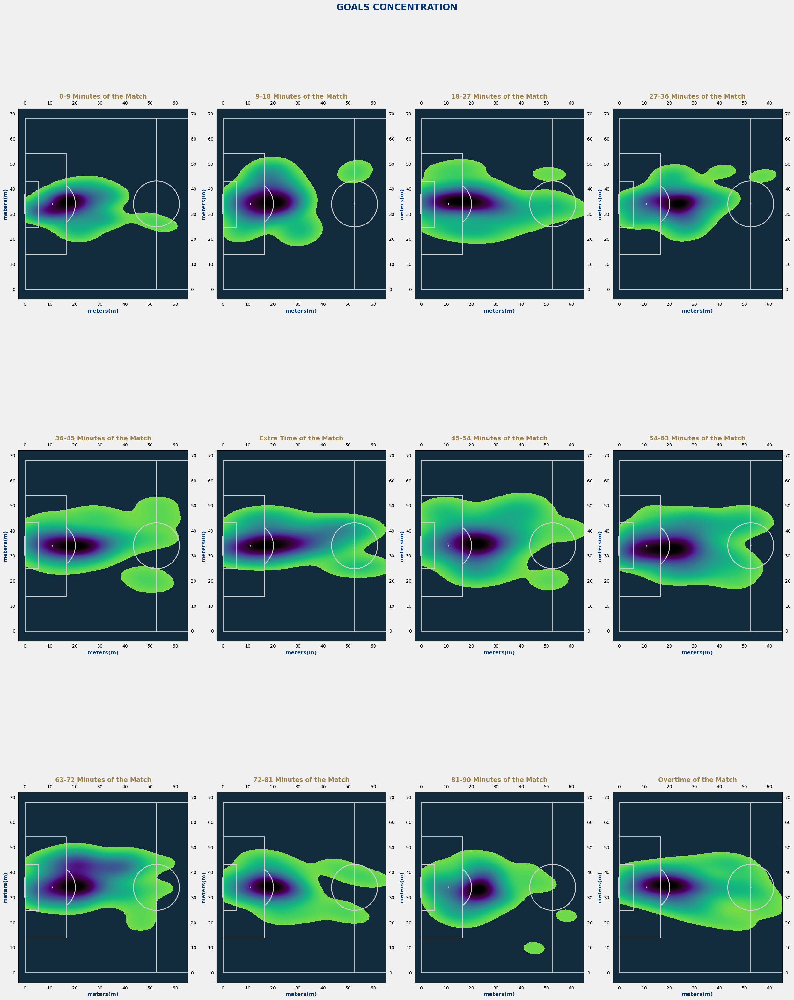

In [34]:
# KDE, goals, 9m, label=goal_scored

pitch = Pitch(half=True, pad_left=55, pad_right=-40, pitch_type='custom', line_color='#cfcfcf', line_zorder=2, pitch_width=68, pitch_length=105,
              axis=True, label=True, pitch_color='#122c3d')


fig, axs = pitch.draw(figsize=(25,35), nrows=3, ncols=4)
fig.patch.set_facecolor('#F0F0F0')  

goal_scored_9m = goal_scored[goal_scored['clock_numeric'] < 10]
kdeplot_dark = pitch.kdeplot(goal_scored_9m.xtimes105, goal_scored_9m.ytimes68, cmap=cmr.lavender_r, fill=True, levels=100, label='Goals Scored', ax=axs[0,0])
axs[0,0].set_title('0-9 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,0].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,0].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])


goal_scored_18m = goal_scored[(goal_scored['clock_numeric'] >10) & (goal_scored['clock_numeric'] <= 18)]
kdeplot_dark = pitch.kdeplot(goal_scored_18m.xtimes105, goal_scored_18m.ytimes68, cmap=cmr.lavender_r, fill=True, levels=100, label='Goals Scored', ax=axs[0,1])
axs[0,1].set_title('9-18 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,1].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,1].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])


goal_scored_27m = goal_scored[(goal_scored['clock_numeric'] > 18) & (goal_scored['clock_numeric'] <= 27)]
kdeplot_dark = pitch.kdeplot(goal_scored_27m.xtimes105, goal_scored_27m.ytimes68, cmap=cmr.lavender_r, fill=True, levels=100, label='Goals Scored', ax=axs[0,2])
axs[0,2].set_title('18-27 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,2].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,2].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

goal_scored_36m = goal_scored[(goal_scored['clock_numeric'] > 27) & (goal_scored['clock_numeric'] <= 36)]
kdeplot_dark = pitch.kdeplot(goal_scored_36m.xtimes105, goal_scored_36m.ytimes68, cmap=cmr.lavender_r, fill=True, levels=100, label='Goals Scored', ax=axs[0,3])
axs[0,3].set_title('27-36 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,3].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,3].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

goal_scored_45m = goal_scored[(goal_scored['clock_numeric'] > 36) & (goal_scored['clock_numeric'] <= 45)]
kdeplot_dark = pitch.kdeplot(goal_scored_45m.xtimes105, goal_scored_45m.ytimes68, cmap=cmr.lavender_r, fill=True, levels=100, label='Goals Scored', ax=axs[1,0])
axs[1,0].set_title('36-45 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,0].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,0].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

goal_scored_extra1 = goal_scored[(goal_scored['clock_numeric'] > 45) & (goal_scored['clock_numeric'] < 46)]
kdeplot_dark = pitch.kdeplot(goal_scored_extra1.xtimes105, goal_scored_extra1.ytimes68, cmap=cmr.lavender_r, fill=True, levels=100, label='Goals Scored', ax=axs[1,1])
axs[1,1].set_title('Extra Time of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,1].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,1].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

### Second Half

goal_scored_54m = goal_scored[(goal_scored['clock_numeric'] >= 46) & (goal_scored['clock_numeric'] < 54)]
kdeplot_dark = pitch.kdeplot(goal_scored_54m.xtimes105, goal_scored_54m.ytimes68, cmap=cmr.lavender_r, fill=True, levels=100, label='Goals Scored', ax=axs[1,2])
axs[1,2].set_title('45-54 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,2].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,2].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])


goal_scored_63m = goal_scored[(goal_scored['clock_numeric'] >= 54) & (goal_scored['clock_numeric'] < 63)]
kdeplot_dark = pitch.kdeplot(goal_scored_63m.xtimes105, goal_scored_63m.ytimes68, cmap=cmr.lavender_r, fill=True, levels=100, label='Goals Scored', ax=axs[1,3])
axs[1,3].set_title('54-63 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,3].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,3].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])


goal_scored_72m = goal_scored[(goal_scored['clock_numeric'] >= 63) & (goal_scored['clock_numeric'] < 72)]
kdeplot_dark = pitch.kdeplot(goal_scored_72m.xtimes105, goal_scored_72m.ytimes68, cmap=cmr.lavender_r, fill=True, levels=100, label='Goals Scored', ax=axs[2,0])
axs[2,0].set_title('63-72 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,0].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,0].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])


goal_scored_81m = goal_scored[(goal_scored['clock_numeric'] >=72) & (goal_scored['clock_numeric'] < 81)]
kdeplot_dark = pitch.kdeplot(goal_scored_81m.xtimes105, goal_scored_81m.ytimes68, cmap=cmr.lavender_r, fill=True, levels=100, label='Goals Scored', ax=axs[2,1])
axs[2,1].set_title('72-81 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,1].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,1].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])


goal_scored_90m = goal_scored[(goal_scored['clock_numeric'] >=81) & (goal_scored['clock_numeric'] <= 90)]
kdeplot_dark = pitch.kdeplot(goal_scored_90m.xtimes105, goal_scored_90m.ytimes68, cmap=cmr.lavender_r, fill=True, levels=100, label='Goals Scored', ax=axs[2,2])
axs[2,2].set_title('81-90 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,2].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,2].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])


goal_scored_extra2 = goal_scored[goal_scored['clock_numeric'] > 90]
kdeplot_dark = pitch.kdeplot(goal_scored_extra2.xtimes105, goal_scored_extra2.ytimes68, cmap=cmr.lavender_r, fill=True, levels=100, label='Goals Scored', ax=axs[2,3])
axs[2,3].set_title('Overtime of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,3].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,3].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

fig.suptitle('GOALS CONCENTRATION', fontsize = 20, weight='bold', color=arsenal_colors[0])

plt.tight_layout();


#### The KDE plot confirms our inference on goals scored in the 63-72min of the match. High goal scoring concentrations are mostly high between the penalty box and the 30meter mark. Overtime does seem to show a smaller range, high concentration aroud the penalty shot mark up to the 25 meter mark. The assumption would be that defending teams are defending tight by the goalkeeper, and attacking teams are not taking as many risks shooting from far. Also, noting that goal concentration seems to be opening up around the start of the second half up until the 63min interval where it begins to narrow again, likewise at the 27-36min interval. 


#### One interesting avenue we want to look at are the goals scored in different types of ways, such as: headers, volleys, penalties, own goals, free kicks, or just straight up shots

In [35]:
# match play type names to play types identified when goals are scored:
# playtype_id names matched from earlier to each type of way that goals are scored

playtype_names = {
    70: 'pure_shot', 
    137: 'header', 
    98: 'penalty', 
    173: 'volley', 
    97: 'own_goal', 
    138: 'free_kick', 
}

# mapping playtype_id to play names

goal_scored['play_name'] = goal_scored['playtype_id'].map(playtype_names)

# a cusom palette to be used so that different play types are the same color or sizes
custom_palette = {
    'pure_shot': 'teal', 
    'header': 'orange', 
    'penalty': 'red', 
    'volley': 'purple', 
    'own_goal': 'black', 
    'free_kick': 'yellow', 
}


C:\Users\vchan\AppData\Local\Temp\ipykernel_28592\1361163714.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goal_scored['play_name'] = goal_scored['playtype_id'].map(playtype_names)


#### We will plot a scatterplot that shows the different types of plays where goals are scored. We will use the goals variable from earlier so that we ensure we are only looking at opportunities that turned into goals. 

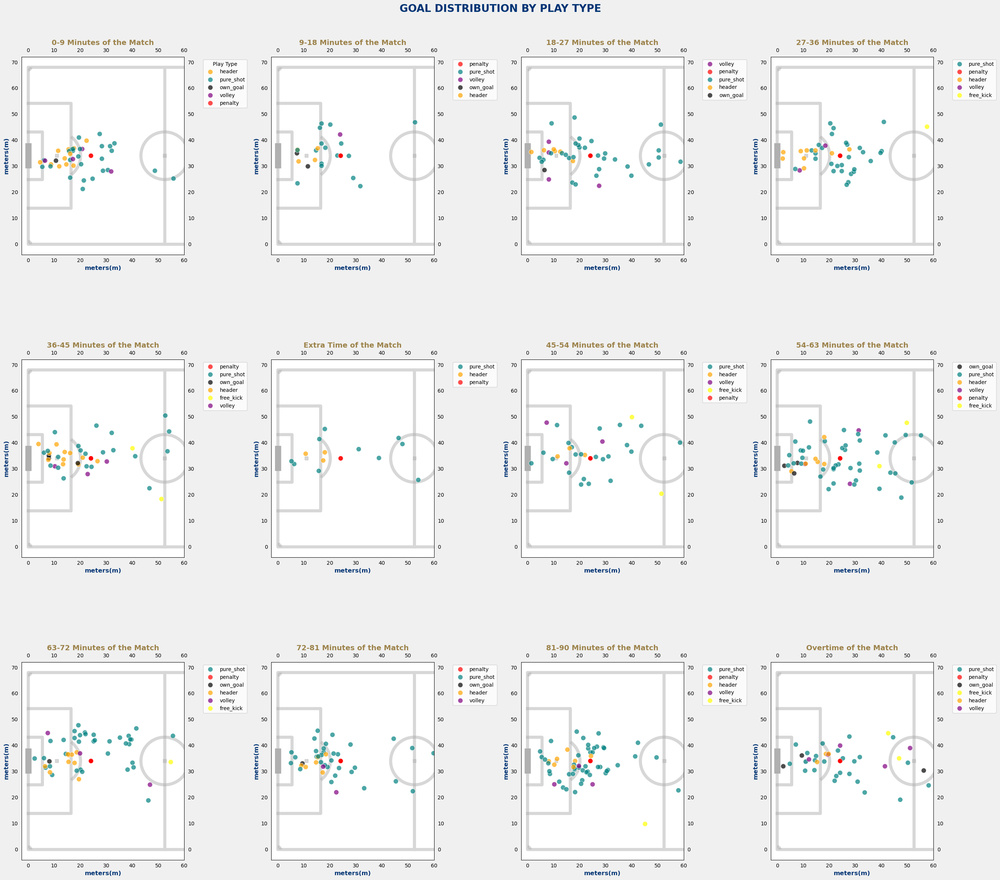

In [36]:
# goals, 9m, hue=play_name
# create pitch
pitch = Pitch(half=True, pad_left=55, pad_right=-45, 
              pitch_type='custom', corner_arcs=True, 
              pitch_width=68, pitch_length=105, axis=True, label=True, 
              line_alpha=0.5, linewidth=6,
              spot_type='square', spot_scale=0.006)

fig, axs = pitch.draw(figsize=(27,25), nrows=3, ncols=4)
# fig.subplots_adjust(wspace=0, hspace=0)

# Set the background color for the figure
fig.patch.set_facecolor('#F0F0F0')  

### 1st half

# 0-9m of the match
goal_scored_9m = goal_scored[goal_scored['clock_numeric'] < 10]
sns.scatterplot(data=goal_scored_9m, x='xtimes105', y='ytimes68', s=90, hue='play_name', palette=custom_palette, alpha=0.7, ax=axs[0,0])
# axs[0,0].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[0,0].legend(title="Play Type", loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[0,0].set_title('0-9 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,0].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,0].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])



# 9-18m of the match
goal_scored_18m = goal_scored[(goal_scored['clock_numeric'] >10) & (goal_scored['clock_numeric'] <= 18)]
sns.scatterplot(data=goal_scored_18m, x='xtimes105', y='ytimes68', s=90, hue='play_name', palette=custom_palette, alpha=0.7, ax=axs[0,1])
axs[0,1].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[0,1].set_title('9-18 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,1].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,1].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])



# 18-27m of the match
goal_scored_27m = goal_scored[(goal_scored['clock_numeric'] > 18) & (goal_scored['clock_numeric'] <= 27)]
sns.scatterplot(data=goal_scored_27m, x='xtimes105', y='ytimes68', s=90, hue='play_name', palette=custom_palette, alpha=0.7, ax=axs[0,2])
axs[0,2].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[0,2].set_title('18-27 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,2].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,2].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])



# 27-36m of the match
goal_scored_36m = goal_scored[(goal_scored['clock_numeric'] > 27) & (goal_scored['clock_numeric'] <= 36)]
sns.scatterplot(data=goal_scored_36m, x='xtimes105', y='ytimes68', s=90, hue='play_name', palette=custom_palette, alpha=0.7, ax=axs[0,3])
axs[0,3].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[0,3].set_title('27-36 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[0,3].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,3].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])




# 36-45m of the match
goal_scored_45m = goal_scored[(goal_scored['clock_numeric'] > 36) & (goal_scored['clock_numeric'] <= 45)]
sns.scatterplot(data=goal_scored_45m, x='xtimes105', y='ytimes68', s=90, hue='play_name', palette=custom_palette, alpha=0.7, ax=axs[1,0])
axs[1,0].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[1,0].set_title('36-45 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,0].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,0].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])




# 45 + et of the match
goal_scored_extra1 = goal_scored[(goal_scored['clock_numeric'] > 45) & (goal_scored['clock_numeric'] < 46)]
sns.scatterplot(data=goal_scored_extra1, x='xtimes105', y='ytimes68', s=90, hue='play_name', palette=custom_palette, alpha=0.7, ax=axs[1,1])
axs[1,1].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[1,1].set_title('Extra Time of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,1].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,1].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])



    
### Second Half

# 45-54 of the match
goal_scored_54m = goal_scored[(goal_scored['clock_numeric'] >= 46) & (goal_scored['clock_numeric'] < 54)]
sns.scatterplot(data=goal_scored_54m, x='xtimes105', y='ytimes68', s=90, hue='play_name', palette=custom_palette, alpha=0.7, ax=axs[1,2])
axs[1,2].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[1,2].set_title('45-54 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,2].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,2].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])




# 54-63m of the match
goal_scored_63m = goal_scored[(goal_scored['clock_numeric'] >= 54) & (goal_scored['clock_numeric'] < 63)]
sns.scatterplot(data=goal_scored_63m, x='xtimes105', y='ytimes68', s=90, hue='play_name', palette=custom_palette, alpha=0.7, ax=axs[1,3])
axs[1,3].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[1,3].set_title('54-63 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[1,3].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,3].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])




# 63-72m of the match
goal_scored_72m = goal_scored[(goal_scored['clock_numeric'] >= 63) & (goal_scored['clock_numeric'] < 72)]
sns.scatterplot(data=goal_scored_72m, x='xtimes105', y='ytimes68', s=90, hue='play_name', palette=custom_palette, alpha=0.7, ax=axs[2,0])
axs[2,0].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[2,0].set_title('63-72 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,0].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,0].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])



# 72-81m of the match
goal_scored_81m = goal_scored[(goal_scored['clock_numeric'] >=72) & (goal_scored['clock_numeric'] < 81)]
sns.scatterplot(data=goal_scored_81m, x='xtimes105', y='ytimes68', s=90, hue='play_name', palette=custom_palette, alpha=0.7, ax=axs[2,1])
axs[2,1].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[2,1].set_title('72-81 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,1].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,1].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])



# 81-90m of the match
goal_scored_90m = goal_scored[(goal_scored['clock_numeric'] >=81) & (goal_scored['clock_numeric'] <= 90)]
sns.scatterplot(data=goal_scored_90m, x='xtimes105', y='ytimes68', s=90, hue='play_name', palette=custom_palette, alpha=0.7, ax=axs[2,2])
axs[2,2].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[2,2].set_title('81-90 Minutes of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,2].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,2].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])



# 90 + et of the match
goal_scored_extra2 = goal_scored[goal_scored['clock_numeric'] > 90]
sns.scatterplot(data=goal_scored_extra2, x='xtimes105', y='ytimes68', s=90, hue='play_name', palette=custom_palette, alpha=0.7, ax=axs[2,3])
axs[2,3].legend(loc='upper left', bbox_to_anchor=(1.1, 1), ncol=1)
axs[2,3].set_title('Overtime of the Match', fontsize=14, weight='bold', color=arsenal_colors[1])
axs[2,3].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[2,3].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])



fig.suptitle('GOAL DISTRIBUTION BY PLAY TYPE', fontsize = 20, weight='bold', color=arsenal_colors[0])

plt.tight_layout();


#### Across all time intervls, we can see that pure shots are the most frequent way that goals are scored. However, looking at other play types, we see that header goals are overtaking the 18m mark in the 27-36min, 54-63min, and overtime. It looks like volleys sort of make an appearance mostly within the 18m mark; they are the least relevant closer to the end of each half. Own goals are as expected within the penalty box, and penalties have a fixed position, so it is difficult to calculate their frequency since they overlap (but, we do not really care about penalties right now)

### Based on our findings from the goals scored from different types of plays, we noticed that headers accounted for a good amount of goals. So we will look further into that right now. 
### Also, further looking at play_type_id, we can categorize a little different to include all play types that were involved in a key event, but did not necessarily end up in a goal. 

In [37]:
# group playtype_id by situations categorized under goal_scored, but were not necessarily a goal
just_shots.groupby('goal_scored')['playtype_id'].value_counts().reset_index()

,goal_scored,playtype_id,count
0,0.0,117,1856
1,0.0,135,1224
2,0.0,106,983
3,0.0,136,115
4,0.0,114,13
5,0.0,113,2
6,0.0,140,2
7,1.0,70,336
8,1.0,137,78
9,1.0,98,65


Seeing the above ids, we check them to see the type of play they are and further assess if they can be useful. Some of these ids we already identified from earlier.

In [38]:
# filter to the above playtype_ids to account for goal and non-goal scoring opportunities
goal_plays = just_shots[just_shots['playtype_id'].isin([117,135, 106, 136, 70, 137, 98, 173, 97, 138])]

# only return our useful columns 
goal_plays = goal_plays[['events','goal_scored','playtype_id','xtimes105','ytimes68','player','team_name']].copy()

goal_plays

,events,goal_scored,playtype_id,xtimes105,ytimes68,player,team_name
4883,Ante Budimir Shot Off Target,0.0,117,NaN,NaN,Ante Budimir,Osasuna
11028,Bertug Yildirim Shot Off Target,0.0,117,21.84,21.012,Bertug Yildirim,Getafe
9496,Enrique García Goal - Header,1.0,137,15.54,36.448,Carlos Martín,Alavés
5179,Julián Álvarez Goal,1.0,70,21.00,21.216,Antoine Griezmann,Atlético Madrid
10921,Beñat Prados Shot Blocked,0.0,135,27.51,19.448,Beñat Prados,Athletic Club
...,...,...,...,...,...,...,...
9097,Gerard Moreno Shot Off Target,0.0,117,11.34,22.712,Gerard Moreno,Villarreal
11329,Fran Vieites Shot On Target,0.0,106,23.73,36.040,Fran Vieites,Real Betis
4999,Unai Gómez Shot Blocked,0.0,135,24.99,32.436,Unai Gómez,Athletic Club
2603,Bertug Yildirim Shot On Target,0.0,106,33.18,33.388,Bertug Yildirim,Getafe


This returned 5416 rows that we can further analyze

In [39]:
goal_play_117 = goal_plays[goal_plays['playtype_id']==117]
# goal_play_35 = goal_plays[goal_plays['playtype_id']==135]
# goal_play_106 = goal_plays[goal_plays['playtype_id']==106]
# goal_play_36 = goal_plays[goal_plays['playtype_id']==136]

goal_play_117['events']

4883         Ante Budimir Shot Off Target
11028     Bertug Yildirim Shot Off Target
5414        Selim Amallah Shot Off Target
3577       Gorka Guruzeta Shot Off Target
12099       Nico Williams Shot Off Target
                       ...               
5410          Abdón Prats Shot Off Target
10632    Dimitri Foulquier Shot Off Targe
5926     Flavien-Enzo Boyomo Shot Off Tar
9097        Gerard Moreno Shot Off Target
2604         Carles Aleñá Shot Off Target
Name: events, Length: 1856, dtype: object

### Our findings indicate that:

#### non-goal scoring 
* 117 is always shot off target
* 135 is shot blocked
* 106 is shot on target
* 136 is hit the woodwork

#### goal scoring
* 70 is a goal, regular shot in freeplay, not own goal
* 137 is a goal with a header
* 98 is a goal from a penalty
* 173 is a goal from a volley
* 97 is an own goal
* 138 is a goal from a free kick


## Let's utilize a heatmap to show us the concentration of values at each general quadrant of the field. 
## Let's look at headers from earlier, and also compare shots on target and blocked shots with goals scored

In [40]:
# new variables for headers, on target shots, and off target shots

on_target = eplpitch[eplpitch['playtype_id']==106]
goals = eplpitch[eplpitch['playtype_id'].isin([70, 137, 173, 97])]
headers = eplpitch[eplpitch['playtype_id']==137]
blocked= eplpitch[eplpitch['playtype_id']==135]



#### Create a heatmap utilizing matplotlib.patheffects along with Pitch from mplsoccer

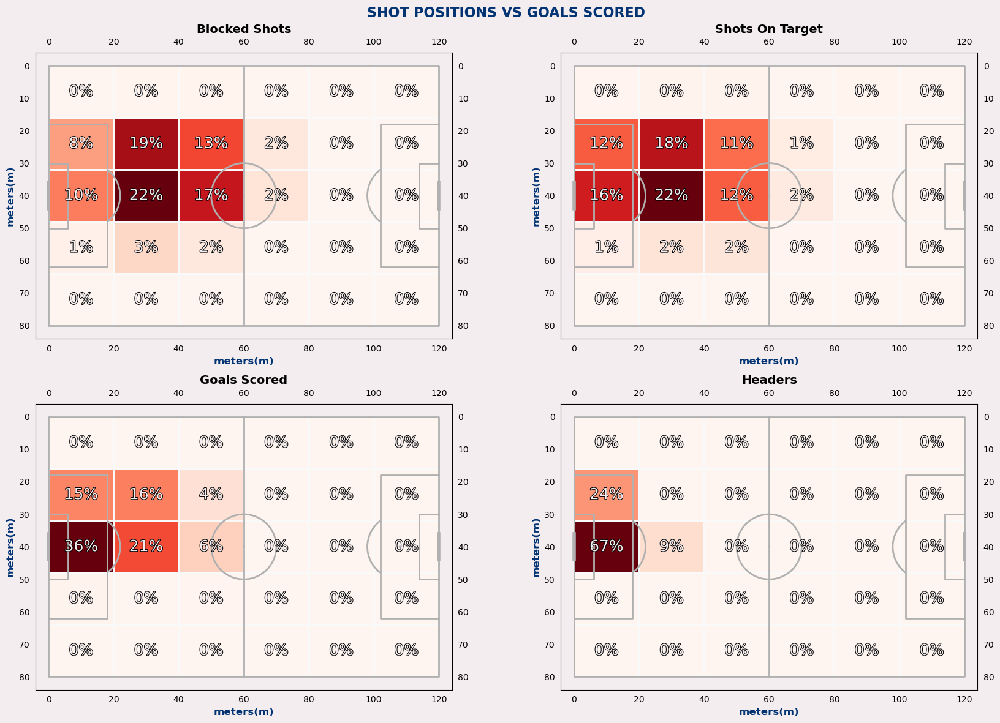

In [41]:
path_eff = [path_effects.Stroke(linewidth=1.5, foreground='black'),
            path_effects.Normal()]


pitch = Pitch(pitch_width=68, pitch_length=105, 
              axis=True, label=True, pitch_type='statsbomb', line_zorder=2, pitch_color='#f4edf0')

## shots off target
fig, axs = pitch.draw(figsize=(18, 12),nrows=2, ncols=2)
fig.set_facecolor('#f4edf0')
bin_statistic1 = pitch.bin_statistic(blocked.xtimes105, blocked.ytimes68, statistic='count', bins=(6, 5), normalize=True)
pitch.heatmap(bin_statistic1, cmap='Reds', edgecolor='#f9f9f9', ax=axs[0,0])
labels = pitch.label_heatmap(bin_statistic1, color='#f4edf0', fontsize=18,
                             ax=axs[0,0], ha='center', va='center',
                             str_format='{:.0%}', path_effects=path_eff)
axs[0,0].set_title('Blocked Shots', fontsize=14, weight='bold')
axs[0,0].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,0].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

## shots on target
bin_statistic2 = pitch.bin_statistic(on_target.xtimes105, on_target.ytimes68, statistic='count', bins=(6, 5), normalize=True)
pitch.heatmap(bin_statistic2, cmap='Reds', edgecolor='#f9f9f9', ax=axs[0,1])
labels = pitch.label_heatmap(bin_statistic2, color='#f4edf0', fontsize=18,
                             ax=axs[0,1], ha='center', va='center',
                             str_format='{:.0%}', path_effects=path_eff)
axs[0,1].set_title('Shots On Target', fontsize=14, weight='bold')
axs[0,1].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[0,1].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

## shots that were goals
bin_statistic3 = pitch.bin_statistic(goals.xtimes105, goals.ytimes68, statistic='count', bins=(6, 5), normalize=True)
pitch.heatmap(bin_statistic3, cmap='Reds', edgecolor='#f9f9f9', ax=axs[1,0])
labels = pitch.label_heatmap(bin_statistic3, color='#f4edf0', fontsize=18,
                             ax=axs[1,0], ha='center', va='center',
                             str_format='{:.0%}', path_effects=path_eff)
axs[1,0].set_title('Goals Scored', fontsize=14, weight='bold')
axs[1,0].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,0].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])

## headers that were goals
bin_statistic4 = pitch.bin_statistic(headers.xtimes105, headers.ytimes68, statistic='count', bins=(6, 5), normalize=True)
pitch.heatmap(bin_statistic4, cmap='Reds', edgecolor='#f9f9f9', ax=axs[1,1])
labels = pitch.label_heatmap(bin_statistic4, color='#f4edf0', fontsize=18,
                             ax=axs[1,1], ha='center', va='center',
                             str_format='{:.0%}', path_effects=path_eff)
axs[1,1].set_title('Headers', fontsize=14, weight='bold')
axs[1,1].set_xlabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])
axs[1,1].set_ylabel('meters(m)', fontsize =12, weight='bold', color=arsenal_colors[0])


fig.suptitle('SHOT POSITIONS VS GOALS SCORED', fontsize=16, weight='bold', color=arsenal_colors[0]);

Both shots off target and shots on target signal to the highest percentage being in the middle (20-40m on the x-axis), meaning that most shots coming from this position did not end up in goals. Goals scored show that most goals have been scored right inside the middle of the penalty box (0-20m from the x-axis) as it is the easiest place on the field to tap the ball and score. An interesting finding is that while most headers were scored in the middle of the penalty box, 33% of headers were scored near the first post on the right side of the attacking team; likewise only 11% of shots on target and 8% of blocked shots were taken from this position. Looking at the goals scored, we see that 21% of goals are scored in that same position, not a small number and should not go unnoticed. Coaches need to train their players to test the goalies more from this position. 

Gaussian heatmps created with mpl soccer. It is not being analyzed in this study but they are pretty cool. The ones below show the difference in shots taken and goals scored, where goals scored seem more centered, close to the penalty line as expected. 

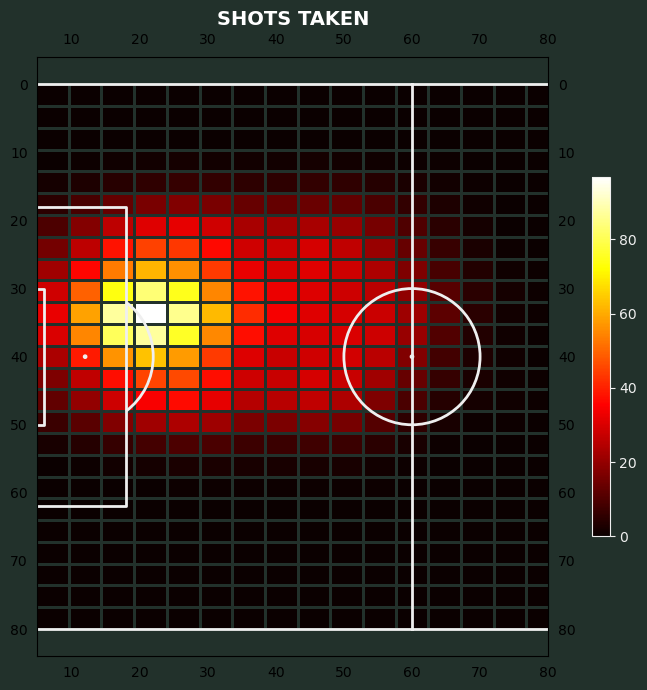

In [42]:
# Tom Decroos, author of `matplotsoccer <https://github.com/TomDecroos/matplotsoccer>`_,
# asked whether it was possible to plot a Gaussian smoothed heatmap,
# which are available in matplotsoccer. Here is an example demonstrating this.

pitch = Pitch(half=True, pad_left=55, pad_right=-40, pitch_width=68, pitch_length=105,
              axis=True, label=True, pitch_type='statsbomb', line_zorder=2,
              pitch_color='#22312b', line_color='#efefef')


# setup pitch
# pitch = Pitch(pitch_type='statsbomb', line_zorder=2,
#               pitch_color='#22312b', line_color='#efefef')
# draw
fig, ax = pitch.draw(figsize=(9, 7))
fig.set_facecolor('#22312b')
bin_statistic = pitch.bin_statistic(just_shots.xtimes105, just_shots.ytimes68, statistic='count', bins=(25, 25))
bin_statistic['statistic'] = gaussian_filter(bin_statistic['statistic'], 1)
pcm = pitch.heatmap(bin_statistic, ax=ax, cmap='hot', edgecolors='#22312b')
# Add the colorbar and format off-white
cbar = fig.colorbar(pcm, ax=ax, shrink=0.6)
cbar.outline.set_edgecolor('#efefef')
cbar.ax.yaxis.set_tick_params(color='#efefef')
ticks = plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='#efefef')
ax.set_title("SHOTS TAKEN", fontsize=14, weight='bold', color='white');

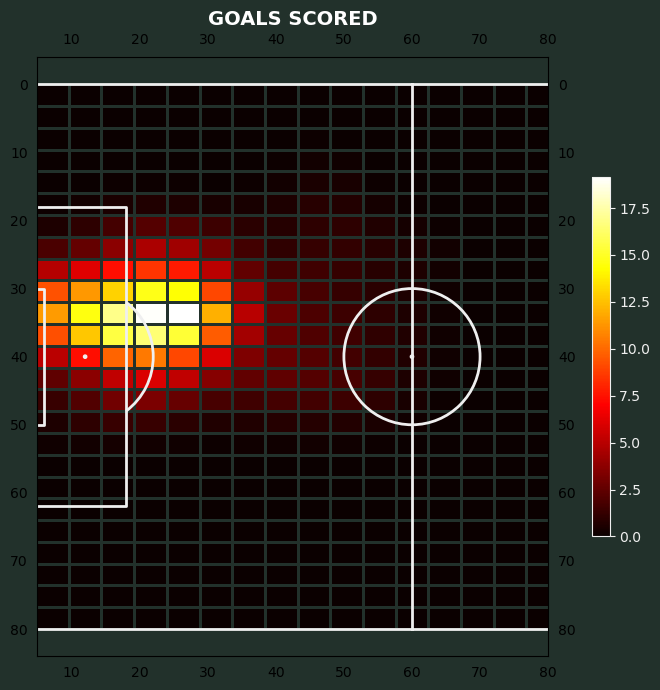

In [43]:
# Tom Decroos, author of `matplotsoccer <https://github.com/TomDecroos/matplotsoccer>`_,
# asked whether it was possible to plot a Gaussian smoothed heatmap,
# which are available in matplotsoccer. Here is an example demonstrating this.

pitch = Pitch(half=True, pad_left=55, pad_right=-40, pitch_width=68, pitch_length=105,
              axis=True, label=True, pitch_type='statsbomb', line_zorder=2,
              pitch_color='#22312b', line_color='#efefef')


# draw
fig, ax = pitch.draw(figsize=(9, 7))
fig.set_facecolor('#22312b')
bin_statistic = pitch.bin_statistic(goal_scored.xtimes105, goal_scored.ytimes68, statistic='count', bins=(25, 25))
bin_statistic['statistic'] = gaussian_filter(bin_statistic['statistic'], 1)
pcm = pitch.heatmap(bin_statistic, ax=ax, cmap='hot', edgecolors='#22312b')
# Add the colorbar and format off-white
cbar = fig.colorbar(pcm, ax=ax, shrink=0.6)


cbar.outline.set_edgecolor('#efefef')
cbar.ax.yaxis.set_tick_params(color='#efefef')
ticks = plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='#efefef')
ax.set_title("GOALS SCORED", fontsize=14, weight='bold', color='white');

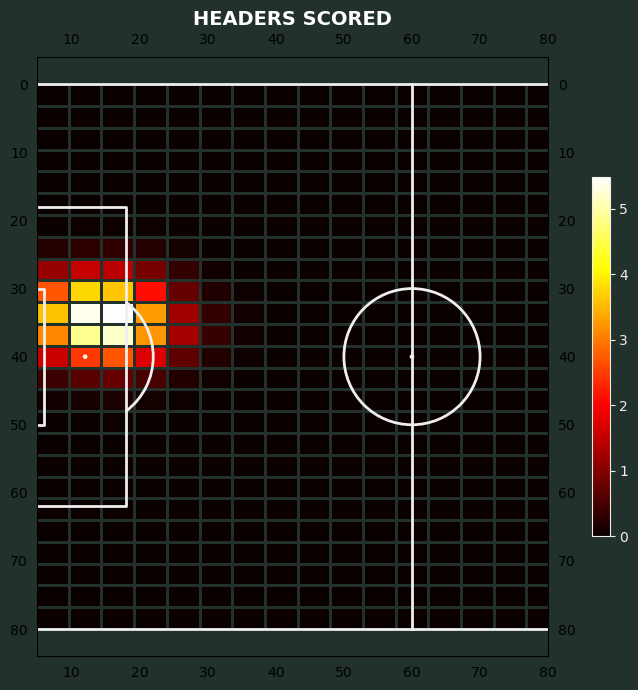

In [44]:
# Tom Decroos, author of `matplotsoccer <https://github.com/TomDecroos/matplotsoccer>`_,
# asked whether it was possible to plot a Gaussian smoothed heatmap,
# which are available in matplotsoccer. Here is an example demonstrating this.

pitch = Pitch(half=True, pad_left=55, pad_right=-40, pitch_width=68, pitch_length=105,
              axis=True, label=True, pitch_type='statsbomb', line_zorder=2,
              pitch_color='#22312b', line_color='#efefef')


# draw
fig, ax = pitch.draw(figsize=(9, 7))
fig.set_facecolor('#22312b')
bin_statistic = pitch.bin_statistic(headers.xtimes105, headers.ytimes68, statistic='count', bins=(25, 25))
bin_statistic['statistic'] = gaussian_filter(bin_statistic['statistic'], 1)
pcm = pitch.heatmap(bin_statistic, ax=ax, cmap='hot', edgecolors='#22312b')
# Add the colorbar and format off-white
cbar = fig.colorbar(pcm, ax=ax, shrink=0.6)


cbar.outline.set_edgecolor('#efefef')
cbar.ax.yaxis.set_tick_params(color='#efefef')
ticks = plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='#efefef')
ax.set_title("HEADERS SCORED", fontsize=14, weight='bold', color='white');